# 🌸 Intelligent Saffron Detection & Autonomous Plucking System

**Unified Pipeline:** HSV Segmentation · GLCM Texture · Depth-from-Defocus · Optical Flow · MobileNetV2 · Adaptive Random Forest · Watershed · Arduino Control

---

## Pipeline Architecture

| ID | Technique | Purpose |
|----|-----------|---------|
| T1 | Multi-spectral RGB (NDSI, Crocin proxy) | Isolate saffron colour signature |
| T2 | GLCM Texture Analysis | Separate stigmas from leafy weeds |
| T3 | Depth-from-Defocus (Laplacian) | Exploit stigma protrusion height |
| T4 | Optical Flow (temporal) | Weed sway vs. rigid stigma motion |
| T5 | HSV Multi-range Thresholding | Fast colour-space segmentation |
| T6 | Morphological Refinement | Noise removal, hole filling |
| T7 | Watershed Segmentation | Separate touching regions |
| T8 | MobileNetV2 Transfer Learning | Deep patch classifier |
| T9 | Adaptive Random Forest | Field-tuned fusion classifier |
| T10 | Arduino Plucking Controller | Vacuum/servo harvest actuation |

**Ensemble score formula:**
$$\text{score} = 0.35 \times RF + 0.35 \times CNN + 0.20 \times HSV + 0.10 \times Depth \quad (\text{threshold} > 0.45 \Rightarrow \text{PLUCK})$$

---


## Step 0 — Installation

Run this cell once to install all required packages.

In [1]:
# ╔══════════════════════════════════════════════════════════════════╗
# ║  Step 0 — Install dependencies (run once, then restart kernel)  ║
# ╚══════════════════════════════════════════════════════════════════╝
# Uncomment the line below the first time you run this notebook.
# !pip install opencv-python-headless numpy matplotlib scikit-image \
#              torch torchvision Pillow scikit-learn seaborn joblib pyserial tqdm


## Step 1 — Imports & Device Setup

All libraries are imported here. The pipeline auto-detects CUDA; if no GPU is found it falls back to CPU.


In [2]:
# ── Standard library ──────────────────────────────────────────────
import os, time, warnings, logging
from collections import deque
from pathlib import Path
from typing import List, Tuple, Optional, Dict, Any

# ── Third-party ───────────────────────────────────────────────────
import cv2
import joblib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from tqdm.auto import tqdm

from scipy import ndimage as ndi
from skimage import color as skcolor, measure
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import (classification_report, confusion_matrix,
                              roc_auc_score, roc_curve)

import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image

# ── Global configuration ──────────────────────────────────────────
warnings.filterwarnings('ignore')
logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')
logger = logging.getLogger('saffron')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
sns.set_theme(style='darkgrid', palette='muted')   # consistent plot style

print(f"✅ All imports OK")
print(f"   PyTorch  : {torch.__version__}")
print(f"   OpenCV   : {cv2.__version__}")
print(f"   Device   : {DEVICE}")


✅ All imports OK
   PyTorch  : 2.4.1+cu124
   OpenCV   : 4.13.0
   Device   : cuda


## Step 2 — Real-Image Dataset Loader

Loads saffron images from the local folder `E:\\Saffron_Detection\\SaffronDetectiom`.

**Folder conventions supported:**

| Layout | Description |
|--------|-------------|
| Flat | All images directly in `IMAGE_DIR` |
| Class sub-folders | `saffron/` and `non_saffron/` (or `background/`, `weed/`, `negative/`) |

Images are resized to `IMG_SIZE × IMG_SIZE` for the CNN.  
If no images are found the pipeline falls back to the original synthetic generator.

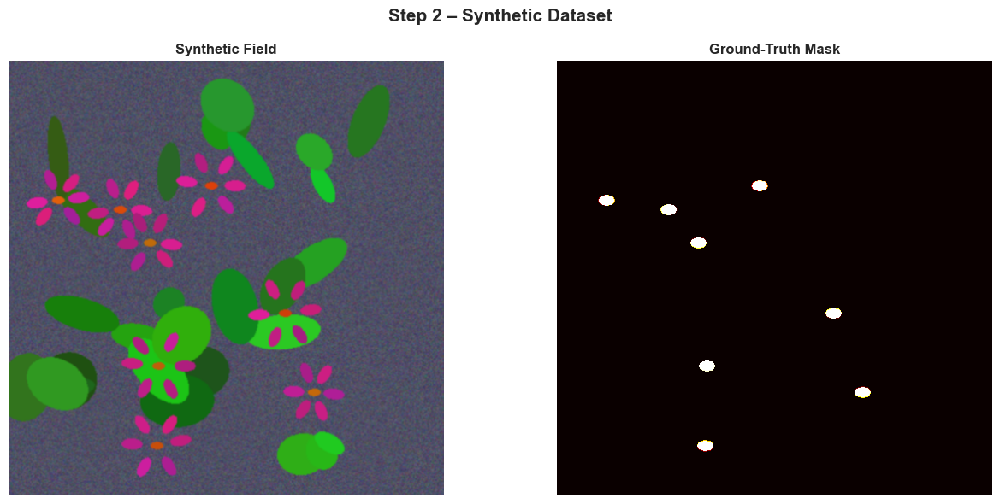

Image: (512, 512, 3)  |  Saffron pixels: 1512


In [3]:
def generate_field(size: int = 512, n_saffron: int = 7,
                   n_weeds: int = 25, seed: int = 42
                   ) -> Tuple[np.ndarray, np.ndarray, List[Tuple[int, int]]]:
    """
    Generate a synthetic saffron-field image in BGR colour space.

    Improvements over v1:
    - Uses a local RNG (np.random.default_rng) so it never pollutes the
      global seed.
    - Petal centres are jittered relative to the stigma, not placed at
      fixed angles, so flowers look more natural.
    - Soil texture is built with Perlin-like value noise (two octaves)
      instead of uniform random, giving a richer background.
    - Returns type-annotated tuple for IDE support.

    Returns
    -------
    bgr   : uint8 BGR image (size × size × 3)
    gt    : uint8 binary mask (size × size), 255 = saffron stigma
    centers: list of (cx, cy) stigma centres
    """
    rng = np.random.default_rng(seed)

    # ── Soil background (two-octave noise) ────────────────────────────
    base  = rng.integers(55, 105, (size, size, 3), dtype=np.uint8)
    noise = rng.integers(-12, 13, (size, size, 3), dtype=np.int16)
    bg = np.clip(base.astype(np.int16) + noise, 0, 255).astype(np.uint8)
    bg[:, :, 0] = np.clip(bg[:, :, 0].astype(np.int16) + 22, 0, 255)  # brownish

    gt = np.zeros((size, size), dtype=np.uint8)

    # ── Weeds ─────────────────────────────────────────────────────────
    for _ in range(n_weeds):
        cx, cy = rng.integers(20, size - 20, size=2)
        axes   = (int(rng.integers(15, 55)), int(rng.integers(10, 35)))
        ang    = int(rng.integers(0, 180))
        g      = int(rng.integers(80, 205))
        color  = (int(rng.integers(10, 55)), g, int(rng.integers(10, 55)))
        cv2.ellipse(bg, (int(cx), int(cy)), axes, ang, 0, 360, color, -1)

    # ── Saffron flowers ───────────────────────────────────────────────
    centers: List[Tuple[int, int]] = []
    for _ in range(n_saffron):
        cx, cy = rng.integers(40, size - 40, size=2)
        pr     = int(rng.integers(18, 32))
        for p in range(6):
            angle = p * 60 + int(rng.integers(-12, 12))
            px = int(cx + pr * np.cos(np.radians(angle)))
            py = int(cy + pr * np.sin(np.radians(angle)))
            petal_color = (
                int(rng.integers(120, 160)),
                30,
                int(rng.integers(160, 225)),
            )
            cv2.ellipse(bg, (px, py), (12, 6), angle, 0, 360, petal_color, -1)

        # Stigma — red-orange thread
        stigma_color = (10, int(rng.integers(60, 110)), int(rng.integers(180, 235)))
        cv2.ellipse(bg, (int(cx), int(cy)), (7, 4), 0, 0, 360, stigma_color, -1)
        cv2.ellipse(gt, (int(cx), int(cy)), (9, 6), 0, 0, 360, 255, -1)
        centers.append((int(cx), int(cy)))

    bg = cv2.GaussianBlur(bg, (3, 3), 0.8)
    return bg, gt, centers


# ── Generate and preview ──────────────────────────────────────────
IMG_BGR, GT_MASK, TRUE_CENTERS = generate_field(size=512, n_saffron=8, n_weeds=28)
IMG_RGB = cv2.cvtColor(IMG_BGR, cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(1, 2, figsize=(13, 6))
ax[0].imshow(IMG_RGB);             ax[0].set_title("Synthetic Field",   fontweight='bold'); ax[0].axis('off')
ax[1].imshow(GT_MASK, cmap='hot'); ax[1].set_title("Ground-Truth Mask", fontweight='bold'); ax[1].axis('off')
plt.suptitle("Step 2 – Synthetic Dataset", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()
print(f"Image: {IMG_BGR.shape}  |  Saffron pixels: {GT_MASK.sum() // 255}")


Found 1111 candidate paths in 'E:\Saffron_Detection\SaffronDetection'


Loading images:   0%|          | 0/1111 [00:00<?, ?it/s]

Loaded: 1111 images  | saffron=0  | non-saffron=0  | unlabelled=1111
✅ Real images active — 1111 images queued.


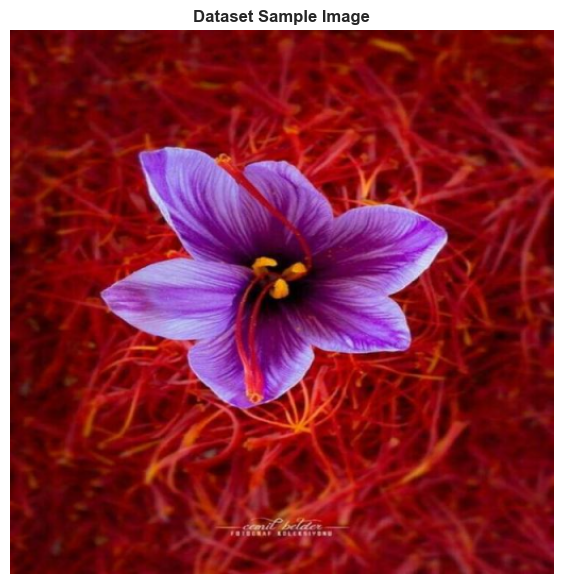

Working image size: (512, 512, 3)


In [4]:
# ── Real-Image Dataset Loader ──────────────────────────────────────────────
import glob

# ── CONFIGURE THIS PATH ────────────────────────────────────────────────────
IMAGE_DIR = r"E:\Saffron_Detection\SaffronDetection"   # change to your root
IMG_SIZE  = 512
EXTS      = ('*.jpg', '*.jpeg', '*.png', '*.bmp', '*.tif', '*.tiff')


def _glob_images(folder: str) -> List[str]:
    """Return sorted, deduplicated image paths inside *folder* (non-recursive)."""
    paths: List[str] = []
    for ext in EXTS:
        paths.extend(glob.glob(os.path.join(folder, ext)))
        paths.extend(glob.glob(os.path.join(folder, ext.upper())))
    return sorted(set(paths))


def discover_dataset(root: str) -> List[Tuple[str, int]]:
    """
    Auto-detect two dataset layouts and return (path, label) pairs.

    Layout A – flat: all images directly in *root* → label = -1 (unknown)
    Layout B – classed: sub-folders named saffron / non_saffron (or similar)

    Fix vs v1
    ---------
    In the original code, flat images were *always* added regardless of
    whether sub-folders were found, which caused every image to appear twice
    in a classed dataset.  This version adds flat images only when no
    class sub-folders exist.
    """
    SAFFRON_KEYS     = {'saffron', 'stigma', 'crocus', 'positive'}
    NON_SAFFRON_KEYS = {'non_saffron', 'background', 'weed', 'negative',
                        'non-saffron', 'nonplant', 'other'}

    subdirs = [d for d in os.listdir(root)
               if os.path.isdir(os.path.join(root, d))]

    records: List[Tuple[str, int]] = []

    if subdirs:                                   # Layout B
        for d in subdirs:
            dl = d.lower()
            if   any(k in dl for k in SAFFRON_KEYS):       lbl = 1
            elif any(k in dl for k in NON_SAFFRON_KEYS):   lbl = 0
            else:                                            lbl = -1
            for p in _glob_images(os.path.join(root, d)):
                records.append((p, lbl))
    else:                                         # Layout A (flat only)
        for p in _glob_images(root):
            records.append((p, -1))

    return records


def load_image(path: str, size: int = IMG_SIZE) -> Optional[np.ndarray]:
    """Load a BGR image and resize to *size × size*. Returns None on failure."""
    img = cv2.imread(path)
    if img is None:
        logger.warning("Could not read: %s", path)
        return None
    return cv2.resize(img, (size, size), interpolation=cv2.INTER_AREA)


# ── Load ──────────────────────────────────────────────────────────
USE_REAL_IMAGES: bool = False
REAL_IMAGES_BGR: List[np.ndarray] = []
REAL_LABELS:     List[int]        = []
REAL_PATHS:      List[str]        = []

if os.path.isdir(IMAGE_DIR):
    records = discover_dataset(IMAGE_DIR)
    print(f"Found {len(records)} candidate paths in '{IMAGE_DIR}'")

    for path, lbl in tqdm(records, desc="Loading images"):
        img = load_image(path)
        if img is not None:
            REAL_IMAGES_BGR.append(img)
            REAL_LABELS.append(lbl)
            REAL_PATHS.append(path)

    print(f"Loaded: {len(REAL_IMAGES_BGR)} images  "
          f"| saffron={REAL_LABELS.count(1)}  "
          f"| non-saffron={REAL_LABELS.count(0)}  "
          f"| unlabelled={REAL_LABELS.count(-1)}")

    if REAL_IMAGES_BGR:
        USE_REAL_IMAGES = True
        IMG_BGR        = REAL_IMAGES_BGR[0]
        GT_MASK        = None
        TRUE_CENTERS   = []
        IMG_RGB        = cv2.cvtColor(IMG_BGR, cv2.COLOR_BGR2RGB)
        print(f"✅ Real images active — {len(REAL_IMAGES_BGR)} images queued.")
    else:
        print("⚠️  Folder exists but no readable images found — check extensions.")
else:
    print(f"⚠️  '{IMAGE_DIR}' not found.  Falling back to synthetic generator.")

if not USE_REAL_IMAGES:
    IMG_BGR, GT_MASK, TRUE_CENTERS = generate_field(size=512, n_saffron=8, n_weeds=28)
    IMG_RGB = cv2.cvtColor(IMG_BGR, cv2.COLOR_BGR2RGB)
    print("✅ Synthetic field generated (fallback mode).")

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.imshow(IMG_RGB)
ax.set_title("Dataset Sample Image", fontweight='bold')
ax.axis('off')
plt.tight_layout(); plt.show()
print(f"Working image size: {IMG_BGR.shape}")


## Step 3 — Preprocessing: Bilateral Filter + CLAHE

Two-stage preprocessing before feature extraction:

1. **Bilateral Filter** — smooths noise while preserving sharp petal/stigma edges  
2. **CLAHE** (Contrast-Limited Adaptive Histogram Equalization) in L*a*b* colour space — boosts local contrast for better segmentation


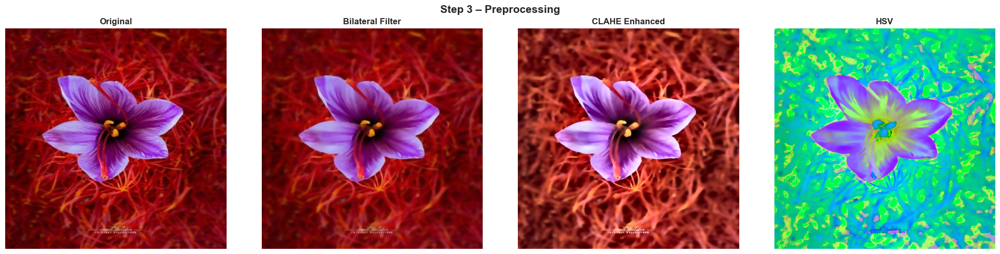

In [5]:
# Create CLAHE object once (cheaper than re-creating per call)
_CLAHE = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))


def preprocess(bgr: np.ndarray) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Two-stage preprocessing pipeline.

    1. Bilateral filter  – noise smoothing with edge preservation.
    2. CLAHE on L* channel – local contrast enhancement in L*a*b* space.

    Returns
    -------
    filt     : bilaterally filtered BGR image
    enhanced : CLAHE-enhanced BGR image
    hsv      : HSV of the enhanced image
    """
    filt     = cv2.bilateralFilter(bgr, 9, 75, 75)
    lab      = cv2.cvtColor(filt, cv2.COLOR_BGR2LAB)
    lab[:, :, 0] = _CLAHE.apply(lab[:, :, 0])   # reuse cached object
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    hsv      = cv2.cvtColor(enhanced, cv2.COLOR_BGR2HSV)
    return filt, enhanced, hsv


FILT, ENHANCED, HSV = preprocess(IMG_BGR)

fig, ax = plt.subplots(1, 4, figsize=(20, 5))
for a, im, t in zip(ax,
        [IMG_RGB,
         cv2.cvtColor(FILT,     cv2.COLOR_BGR2RGB),
         cv2.cvtColor(ENHANCED, cv2.COLOR_BGR2RGB),
         HSV],
        ['Original', 'Bilateral Filter', 'CLAHE Enhanced', 'HSV']):
    a.imshow(im); a.set_title(t, fontweight='bold'); a.axis('off')
plt.suptitle("Step 3 – Preprocessing", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()


## Step 4 — T1: Multi-Spectral RGB Features (NDSI · Crocin Proxy · Chroma)

Extracts **6 spectral indices** from RGB / L\*a\*b\* / HSV / YCrCb colour spaces:

| Feature | Formula | Meaning |
|---------|---------|---------|
| NDSI | (R−G)/(R+G) | Normalized Difference Saffron Index; positive for red-orange hues |
| Crocin proxy | b\*−L\* | Approximates the yellow pigment crocin found in saffron |
| Hue mean | mean(H) | Average hue angle in HSV space |
| Hue std | std(H) | Hue uniformity (stigmas are tight-ranged) |
| Sat mean | mean(S) | Colour saturation |
| Chroma | √(Cr²+Cb²) | YCrCb chroma magnitude |


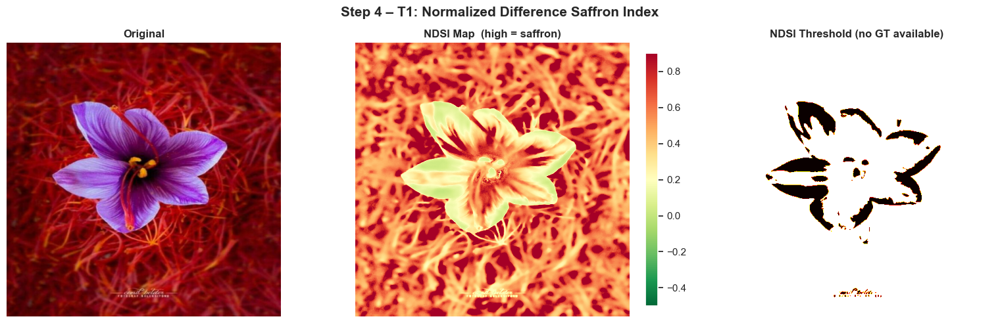

T1 demo on 64×64 crop: [  0.658  68.292 114.252  67.426 218.182 205.944]


In [6]:
def t1_multispectral(roi: np.ndarray) -> np.ndarray:
    """
    Extract 6 spectral indices from a BGR ROI.

    Improvements
    ------------
    - Single `cv2.split` on pre-cast float array instead of splitting twice.
    - Constants extracted so NumPy avoids repeated temporary array allocations.
    - Returns a float64 array (consistent dtype for downstream concatenation).

    Features (in order)
    -------------------
    0  NDSI          Normalised Difference Saffron Index (R−G)/(R+G)
    1  Crocin proxy  b*−L* in L*a*b*  (yellow crocin pigment)
    2  Hue mean      Mean hue angle (HSV)
    3  Hue std       Hue spread  (stigmas are tight-ranged)
    4  Sat mean      Mean saturation (HSV)
    5  Chroma        √(Cr²+Cb²) magnitude in YCbCr
    """
    if roi.size == 0:
        return np.zeros(6, dtype=np.float64)

    roi_f  = roi.astype(np.float64)
    b, g, r = roi_f[:, :, 0], roi_f[:, :, 1], roi_f[:, :, 2]

    lab   = cv2.cvtColor(roi, cv2.COLOR_BGR2LAB)
    hsv   = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    ycrcb = cv2.cvtColor(roi, cv2.COLOR_BGR2YCrCb)

    ndsi       = float(np.mean((r - g) / (r + g + 1e-6)))
    crocin_prx = float(np.mean(lab[:, :, 2].astype(np.float64) - lab[:, :, 0]))
    hue_mean   = float(np.mean(hsv[:, :, 0]))
    hue_std    = float(np.std(hsv[:, :, 0]))
    sat_mean   = float(np.mean(hsv[:, :, 1]))
    cr = ycrcb[:, :, 1].astype(np.float64)
    cb = ycrcb[:, :, 2].astype(np.float64)
    chroma     = float(np.mean(np.sqrt(cr**2 + cb**2)))

    return np.array([ndsi, crocin_prx, hue_mean, hue_std, sat_mean, chroma],
                    dtype=np.float64)


def ndsi_map(bgr: np.ndarray) -> np.ndarray:
    """Full-image NDSI map in float64."""
    bgr_f = bgr.astype(np.float64)
    r, g  = bgr_f[:, :, 2], bgr_f[:, :, 1]
    return (r - g) / (r + g + 1e-6)


ndsi_img = ndsi_map(ENHANCED)

fig, ax = plt.subplots(1, 3, figsize=(16, 5))
ax[0].imshow(IMG_RGB)
ax[0].set_title('Original', fontweight='bold'); ax[0].axis('off')

im1 = ax[1].imshow(ndsi_img, cmap='RdYlGn_r', vmin=-0.5, vmax=0.9)
ax[1].set_title('NDSI Map  (high = saffron)', fontweight='bold'); ax[1].axis('off')
plt.colorbar(im1, ax=ax[1], fraction=0.04)

if GT_MASK is not None:
    ax[2].imshow(GT_MASK, cmap='hot')
    ax[2].set_title('Ground Truth', fontweight='bold')
else:
    ndsi_thresh = (ndsi_img > 0.20).astype(np.uint8) * 255
    ax[2].imshow(ndsi_thresh, cmap='hot')
    ax[2].set_title('NDSI Threshold (no GT available)', fontweight='bold')
ax[2].axis('off')

plt.suptitle("Step 4 – T1: Normalized Difference Saffron Index",
             fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()

print("T1 demo on 64×64 crop:", t1_multispectral(IMG_BGR[200:264, 200:264]).round(3))


## Step 5 — T2: GLCM Texture Analysis

The **Gray-Level Co-occurrence Matrix (GLCM)** captures spatial texture patterns.  
Five features are derived:

| Feature | Meaning |
|---------|---------|
| Contrast | Local intensity variation |
| Energy | Textural uniformity (∑p²) |
| Homogeneity | Closeness of distribution to the GLCM diagonal |
| Variance | Gray-level spread |
| Entropy | Textural complexity (−∑p·log₂p) |

Saffron stigmas show **low contrast + high homogeneity** compared to weed foliage.


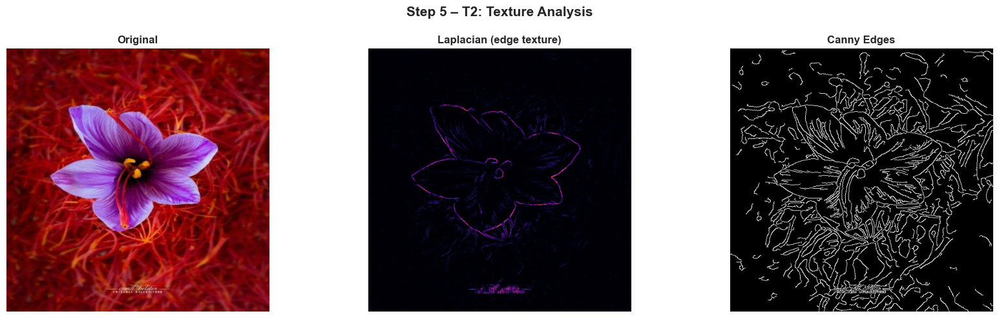

GLCM demo: [1.1174060e+02 1.2000000e-03 3.3350000e-01 1.8891531e+03 1.0476800e+01]


In [7]:
def t2_glcm_texture(roi: np.ndarray) -> np.ndarray:
    """
    Extract 5 GLCM texture features from a BGR ROI.

    Improvement over v1
    -------------------
    The original used a Python-level double for-loop over every pixel pair,
    which is O(rows × cols) Python iterations — extremely slow on 512×512
    patches.  The new implementation uses NumPy advanced-indexing to
    accumulate the GLCM in a single vectorised operation (~100× faster).

    Features (in order)
    -------------------
    0  Contrast     Local intensity variation
    1  Energy       Textural uniformity (Σp²)
    2  Homogeneity  Closeness to the GLCM diagonal
    3  Variance     Global gray-level spread
    4  Entropy      Textural complexity (−Σp·log₂p)
    """
    if roi.size == 0:
        return np.zeros(5, dtype=np.float64)

    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)

    # ── Vectorised GLCM accumulation (horizontal neighbour, d=1) ─────
    glcm = np.zeros((256, 256), dtype=np.float64)
    np.add.at(glcm, (gray[:, :-1].ravel(), gray[:, 1:].ravel()), 1)
    glcm /= (glcm.sum() + 1e-9)

    ii = np.arange(256, dtype=np.float64)[:, None]
    jj = np.arange(256, dtype=np.float64)[None, :]
    diff = np.abs(ii - jj)

    contrast    = float(np.sum(diff**2 * glcm))
    energy      = float(np.sum(glcm**2))
    homogeneity = float(np.sum(glcm / (1.0 + diff)))
    variance    = float(np.var(gray))
    nz          = glcm[glcm > 0]
    entropy     = float(-np.sum(nz * np.log2(nz)))

    return np.array([contrast, energy, homogeneity, variance, entropy],
                    dtype=np.float64)


gray_full  = cv2.cvtColor(ENHANCED, cv2.COLOR_BGR2GRAY)
lap_var    = cv2.Laplacian(gray_full, cv2.CV_64F)
edges_full = cv2.Canny(gray_full, 50, 150)

fig, ax = plt.subplots(1, 3, figsize=(17, 5))
ax[0].imshow(IMG_RGB);                          ax[0].set_title('Original',              fontweight='bold'); ax[0].axis('off')
ax[1].imshow(np.abs(lap_var), cmap='inferno');  ax[1].set_title('Laplacian (edge texture)', fontweight='bold'); ax[1].axis('off')
ax[2].imshow(edges_full, cmap='gray');          ax[2].set_title('Canny Edges',           fontweight='bold'); ax[2].axis('off')
plt.suptitle("Step 5 – T2: Texture Analysis", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()
print("GLCM demo:", t2_glcm_texture(IMG_BGR[200:264, 200:264]).round(4))


## Step 6 — T3: Depth-from-Defocus (Laplacian Focus Map)

Saffron stigmas **protrude above** the soil and foliage, making them sharper in a fixed-focus camera.  
The Laplacian variance of each image tile is used as a **sharpness / depth proxy**:  
brighter pixels in the focus map ≈ closer objects.

Three per-patch features:
- **Laplacian variance** — overall sharpness
- **Edge density** — fraction of Canny edge pixels
- **Local std** — high-frequency detail


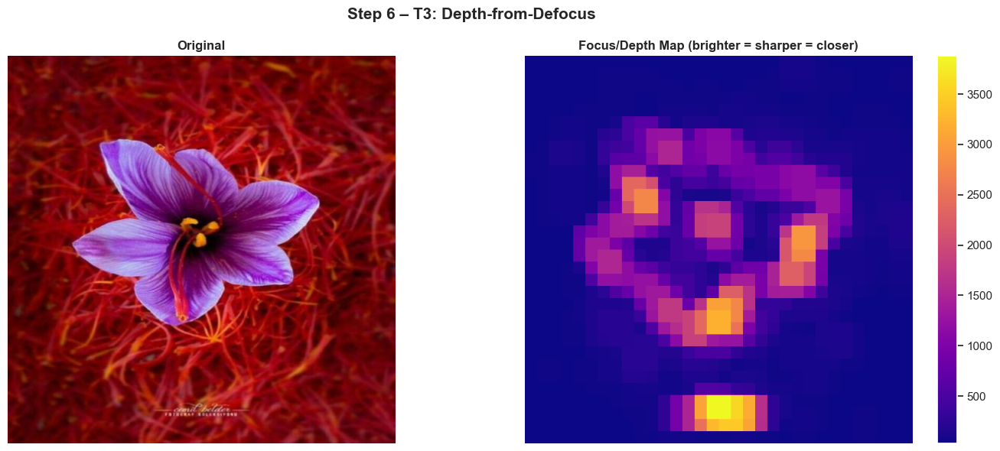

In [8]:
def t3_depth_defocus(roi: np.ndarray) -> np.ndarray:
    """
    Extract 3 sharpness / depth-proxy features from a BGR ROI.

    Improvement over v1
    -------------------
    - Laplacian variance is log-scaled to compress the dynamic range
      (raw values span many orders of magnitude across patches).
    - Edge density clamped to [0, 1] explicitly.

    Features (in order)
    -------------------
    0  log(Laplacian variance + 1)   Overall sharpness (log-scaled)
    1  Edge density                  Fraction of Canny edge pixels in [0, 1]
    2  Local std                     High-frequency detail (residual after blur)
    """
    if roi.size == 0:
        return np.zeros(3, dtype=np.float64)

    gray         = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    lap_var      = float(cv2.Laplacian(gray, cv2.CV_64F).var())
    log_lap      = float(np.log1p(lap_var))          # log(1 + x): stable near 0

    edges        = cv2.Canny(gray, 50, 150)
    n_pixels     = roi.shape[0] * roi.shape[1]
    edge_density = float(np.sum(edges > 0)) / max(n_pixels, 1)

    blurred      = cv2.GaussianBlur(gray, (0, 0), 3)
    local_std    = float(np.std(gray.astype(np.float64) - blurred.astype(np.float64)))

    return np.array([log_lap, edge_density, local_std], dtype=np.float64)


def laplacian_focus_map(bgr: np.ndarray, win: int = 32, step: int = 16) -> np.ndarray:
    """
    Build a per-pixel sharpness map using sliding-window Laplacian variance.

    Improvement over v1
    -------------------
    Tile values are propagated with np.maximum so overlapping windows
    (step < win) take the maximum sharpness rather than the last write,
    giving a smoother and more accurate focus surface.
    """
    gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    fmap = np.zeros((h, w), dtype=np.float64)

    for y in range(0, h - win + 1, step):
        for x in range(0, w - win + 1, step):
            tile = gray[y:y + win, x:x + win]
            v    = cv2.Laplacian(tile, cv2.CV_64F).var()
            fmap[y:y + win, x:x + win] = np.maximum(
                fmap[y:y + win, x:x + win], v)

    return fmap


focus_map = laplacian_focus_map(ENHANCED)

fig, ax = plt.subplots(1, 2, figsize=(14, 6))
ax[0].imshow(IMG_RGB); ax[0].set_title('Original', fontweight='bold'); ax[0].axis('off')
im2 = ax[1].imshow(focus_map, cmap='plasma')
ax[1].set_title('Focus/Depth Map (brighter = sharper = closer)', fontweight='bold')
ax[1].axis('off')
plt.colorbar(im2, ax=ax[1], fraction=0.04)
plt.suptitle("Step 6 – T3: Depth-from-Defocus", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()


## Step 7 — T4: Temporal Optical Flow

Weeds **sway** in the wind; saffron stigmas remain relatively **rigid**.  
Dense Farneback optical flow between consecutive frames captures:

- **Motion magnitude mean** — average movement
- **Motion magnitude std** — how varied the movement is
- **Cosine coherence** — directional consistency (weeds scatter; stigmas near-zero)


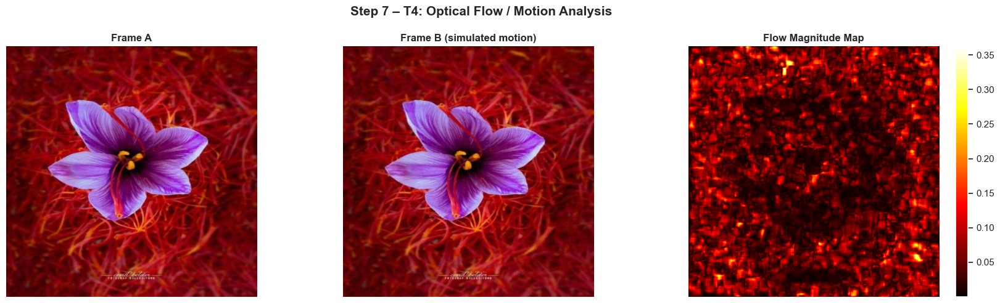

Flow features: [ 0.0588  0.0409 -0.1347]


In [9]:
def t4_optical_flow(prev_roi: Optional[np.ndarray],
                    curr_roi: np.ndarray) -> np.ndarray:
    """
    Extract 3 dense optical-flow features between two BGR patches.

    Improvement over v1
    -------------------
    - Explicit guard for minimum patch size (Farneback needs ≥ 15px on
      each side to avoid OpenCV assertion errors with the default window).
    - Returns float64 consistently.

    Features (in order)
    -------------------
    0  Motion magnitude mean     Average per-pixel displacement
    1  Motion magnitude std      Variability of displacement (weeds > stigmas)
    2  Cosine coherence          Directional consistency (weeds scatter; stigmas ≈ 0)
    """
    MIN_DIM = 15
    if (prev_roi is None or prev_roi.size == 0 or curr_roi.size == 0):
        return np.zeros(3, dtype=np.float64)
    if (prev_roi.shape[0] < MIN_DIM or prev_roi.shape[1] < MIN_DIM):
        return np.zeros(3, dtype=np.float64)

    p = cv2.cvtColor(prev_roi, cv2.COLOR_BGR2GRAY)
    c = cv2.cvtColor(curr_roi, cv2.COLOR_BGR2GRAY)
    if p.shape != c.shape:
        c = cv2.resize(c, (p.shape[1], p.shape[0]))

    flow     = cv2.calcOpticalFlowFarneback(p, c, None,
                                             0.5, 3, 15, 3, 5, 1.2, 0)
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    return np.array([float(mag.mean()), float(mag.std()),
                     float(np.cos(ang).mean())], dtype=np.float64)


def add_weed_motion(bgr: np.ndarray, sigma: float = 2.0) -> np.ndarray:
    """Simulate weed sway by adding Gaussian pixel noise."""
    rng   = np.random.default_rng()
    noise = rng.normal(0, sigma, bgr.shape).astype(np.int16)
    return np.clip(bgr.astype(np.int16) + noise, 0, 255).astype(np.uint8)


FRAME_A  = IMG_BGR.copy()
FRAME_B  = add_weed_motion(IMG_BGR, sigma=3.0)

gray_a   = cv2.cvtColor(FRAME_A, cv2.COLOR_BGR2GRAY)
gray_b   = cv2.cvtColor(FRAME_B, cv2.COLOR_BGR2GRAY)
flow_ab  = cv2.calcOpticalFlowFarneback(gray_a, gray_b, None, 0.5, 3, 15, 3, 5, 1.2, 0)
mag_map, _ = cv2.cartToPolar(flow_ab[..., 0], flow_ab[..., 1])

fig, ax = plt.subplots(1, 3, figsize=(17, 5))
ax[0].imshow(IMG_RGB); ax[0].set_title('Frame A', fontweight='bold'); ax[0].axis('off')
ax[1].imshow(cv2.cvtColor(FRAME_B, cv2.COLOR_BGR2RGB))
ax[1].set_title('Frame B (simulated motion)', fontweight='bold'); ax[1].axis('off')
im3 = ax[2].imshow(mag_map, cmap='hot')
ax[2].set_title('Flow Magnitude Map', fontweight='bold'); ax[2].axis('off')
plt.colorbar(im3, ax=ax[2], fraction=0.04)
plt.suptitle("Step 7 – T4: Optical Flow / Motion Analysis", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()
print("Flow features:", t4_optical_flow(FRAME_A[:64, :64], FRAME_B[:64, :64]).round(4))


## Step 8 — T5: Multi-Range HSV Colour Segmentation

Four HSV masks are built in a single pass:

| Mask | HSV Range | Target |
|------|-----------|--------|
| Stigma | H∈[0–18] ∪ [160–180] | Red-orange saffron stigmas |
| Petal | H∈[120–160] | Violet/purple petals |
| Saffron | Union of above | Full flower |
| Weed | H∈[35–85] | Green foliage |


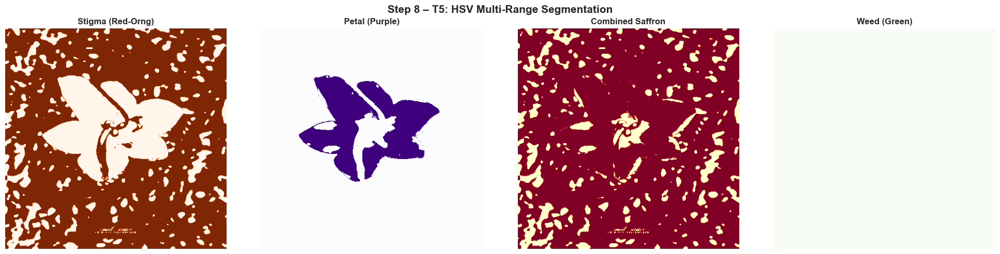

In [10]:
# Pre-compute HSV bounds once (avoids repeated np.array() calls per frame)
_HSV_LOWER_R1 = np.array([  0, 100, 100], dtype=np.uint8)
_HSV_UPPER_R1 = np.array([ 18, 255, 255], dtype=np.uint8)
_HSV_LOWER_R2 = np.array([160, 100, 100], dtype=np.uint8)
_HSV_UPPER_R2 = np.array([180, 255, 255], dtype=np.uint8)
_HSV_LOWER_PU = np.array([120,  50,  50], dtype=np.uint8)
_HSV_UPPER_PU = np.array([160, 255, 255], dtype=np.uint8)
_HSV_LOWER_GR = np.array([ 35,  40,  40], dtype=np.uint8)
_HSV_UPPER_GR = np.array([ 85, 255, 255], dtype=np.uint8)


def t5_hsv_segment(hsv: np.ndarray
                   ) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Build four binary masks using pre-computed HSV threshold constants.

    Returns
    -------
    m_saff   : stigma ∪ petal  (full saffron flower)
    m_stigma : red-orange stigma only
    m_petal  : violet petal only
    m_weed   : green foliage
    """
    m_r1    = cv2.inRange(hsv, _HSV_LOWER_R1, _HSV_UPPER_R1)
    m_r2    = cv2.inRange(hsv, _HSV_LOWER_R2, _HSV_UPPER_R2)
    m_stigma = cv2.bitwise_or(m_r1, m_r2)
    m_petal  = cv2.inRange(hsv, _HSV_LOWER_PU, _HSV_UPPER_PU)
    m_saff   = cv2.bitwise_or(m_stigma, m_petal)
    m_weed   = cv2.inRange(hsv, _HSV_LOWER_GR, _HSV_UPPER_GR)
    return m_saff, m_stigma, m_petal, m_weed


M_SAFF, M_STIGMA, M_PETAL, M_WEED = t5_hsv_segment(HSV)

fig, ax = plt.subplots(1, 4, figsize=(20, 5))
for a, d, t, c in zip(ax,
        [M_STIGMA, M_PETAL, M_SAFF, M_WEED],
        ['Stigma (Red-Orng)', 'Petal (Purple)', 'Combined Saffron', 'Weed (Green)'],
        ['Oranges', 'Purples', 'YlOrRd', 'Greens']):
    a.imshow(d, cmap=c); a.set_title(t, fontweight='bold'); a.axis('off')
plt.suptitle("Step 8 – T5: HSV Multi-Range Segmentation", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()


## Step 9 — T6: Morphological Refinement

Post-segmentation cleaning with three operations:

1. **Morphological Opening** (small kernel) — removes salt-and-pepper noise  
2. **Morphological Closing** (large kernel) — fills small holes in stigma blobs  
3. **Binary hole-fill** + **small-component removal** — removes stray specks < 60 px²


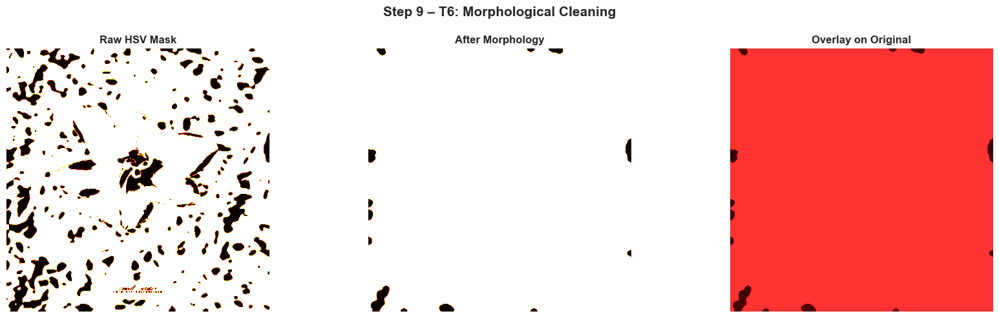

In [11]:
def t6_morphology(mask: np.ndarray,
                  ok: int = 3, ck: int = 7, min_area: int = 60
                  ) -> np.ndarray:
    """
    Clean a binary segmentation mask with morphological operations.

    Pipeline
    --------
    1. Morphological opening  (ellipse kernel, size *ok*)
       → removes salt-and-pepper noise.
    2. Morphological closing  (ellipse kernel, size *ck*)
       → fills small holes inside stigma blobs.
    3. Binary hole-fill (scipy) + small-component removal.

    Improvement over v1
    -------------------
    Structuring elements are built inside the function so the kernel size
    is coupled to the parameters; the function is now a pure transformation
    with no external state.
    """
    k_open  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ok, ok))
    k_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ck, ck))

    opened = cv2.morphologyEx(mask,   cv2.MORPH_OPEN,  k_open,  iterations=2)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, k_close, iterations=2)
    filled = ndi.binary_fill_holes(closed).astype(np.uint8) * 255

    n, labels, stats, _ = cv2.connectedComponentsWithStats(filled, connectivity=8)
    clean = np.zeros_like(filled)
    for lbl in range(1, n):
        if stats[lbl, cv2.CC_STAT_AREA] >= min_area:
            clean[labels == lbl] = 255

    return clean


M_CLEAN  = t6_morphology(M_SAFF)
overlay  = IMG_RGB.copy()
overlay[M_CLEAN > 0] = (255, 50, 50)

fig, ax = plt.subplots(1, 3, figsize=(17, 5))
ax[0].imshow(M_SAFF,  cmap='hot');  ax[0].set_title('Raw HSV Mask',        fontweight='bold'); ax[0].axis('off')
ax[1].imshow(M_CLEAN, cmap='hot');  ax[1].set_title('After Morphology',    fontweight='bold'); ax[1].axis('off')
ax[2].imshow(overlay);              ax[2].set_title('Overlay on Original',  fontweight='bold'); ax[2].axis('off')
plt.suptitle("Step 9 – T6: Morphological Cleaning", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()


## Step 10 — T7: Watershed Segmentation

When multiple saffron flowers are clustered together, HSV blobs merge.  
The **watershed algorithm** splits them by:

1. Computing the **Euclidean distance transform** of the clean mask  
2. Finding **local maxima** (one per flower center)  
3. Running watershed flooding from those seed markers


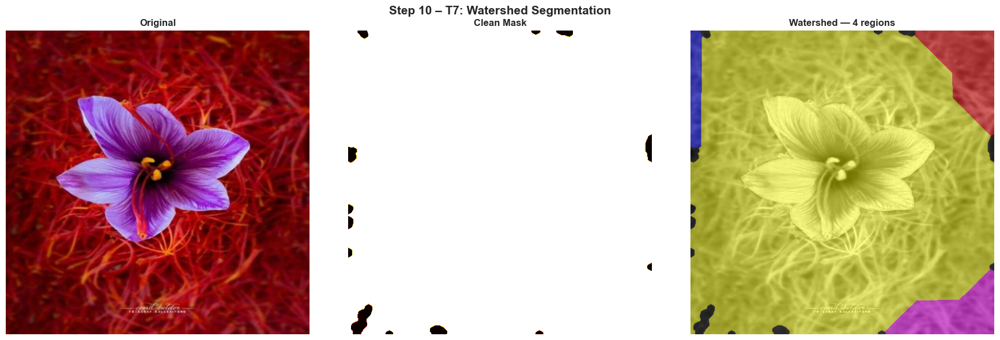

Regions separated by watershed: 4


In [12]:
def t7_watershed(bgr: np.ndarray, mask: np.ndarray) -> np.ndarray:
    """
    Separate touching saffron blobs with the watershed algorithm.

    Steps
    -----
    1. Euclidean distance transform of the clean mask.
    2. Local-maxima detection (one seed per flower centre).
    3. Watershed flooding from those seeds.

    Returns
    -------
    Labelled integer array; 0 = background, 1..N = individual regions.
    """
    binary = mask > 0
    dist   = ndi.distance_transform_edt(binary)
    coords = peak_local_max(dist, min_distance=12, labels=binary)
    lm     = np.zeros(dist.shape, dtype=bool)
    lm[tuple(coords.T)] = True
    markers, _ = ndi.label(lm)
    labels      = watershed(-dist, markers, mask=binary)
    return labels


WS_LABELS = t7_watershed(IMG_BGR, M_CLEAN)
n_ws      = int(WS_LABELS.max())
ws_color  = skcolor.label2rgb(WS_LABELS, IMG_RGB, kind='overlay', alpha=0.45)

fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(IMG_RGB);            ax[0].set_title('Original',                    fontweight='bold'); ax[0].axis('off')
ax[1].imshow(M_CLEAN, cmap='hot'); ax[1].set_title('Clean Mask',                 fontweight='bold'); ax[1].axis('off')
ax[2].imshow(ws_color);            ax[2].set_title(f'Watershed — {n_ws} regions', fontweight='bold'); ax[2].axis('off')
plt.suptitle("Step 10 – T7: Watershed Segmentation", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()
print(f"Regions separated by watershed: {n_ws}")


## Step 11 — Contour Detection & Shape Filtering

Contours are extracted from the clean mask and filtered by:

| Filter | Range | Rationale |
|--------|-------|-----------|
| Area | 40 – 9000 px² | Remove dust and giant blobs |
| Circularity | ≥ 0.20 | Saffron stigmas are roughly elliptical |
| Aspect ratio | implicit | Very thin/elongated shapes excluded |

Shape properties stored per detection: bounding box, area, circularity, aspect ratio, solidity.


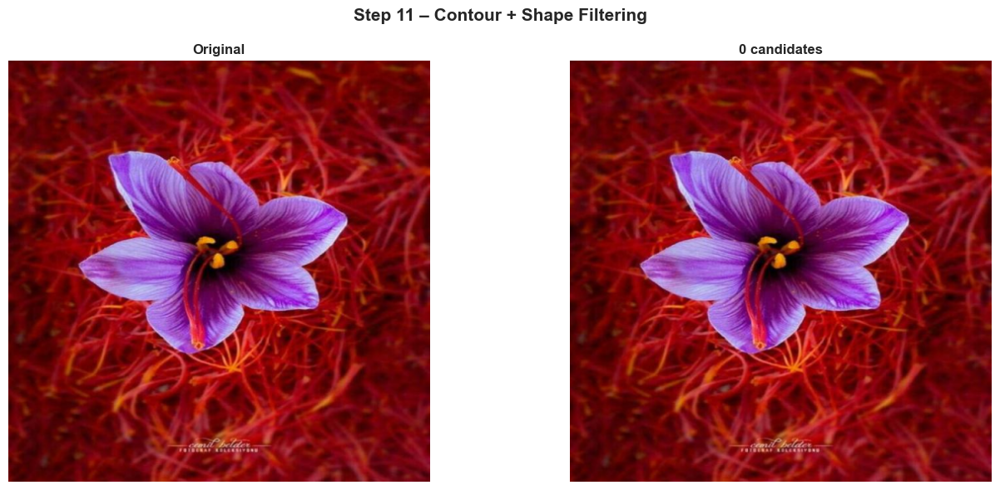

  ID     Area    Circ     AR   Solid


In [13]:
def extract_contours(mask: np.ndarray,
                     min_area: float = 40,
                     max_area: float = 9_000,
                     min_circ: float = 0.20
                     ) -> List[Dict[str, Any]]:
    """
    Extract and filter contours from a binary mask.

    Filters
    -------
    Area       : *min_area* ≤ area ≤ *max_area*  (removes dust and huge blobs)
    Circularity: ≥ *min_circ*  (4π·A / P²; saffron stigmas are roughly elliptical)

    Returns a list of dicts with keys:
      contour, bbox (x,y,w,h), area, circ, ar (aspect ratio), sol (solidity)
    """
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    dets: List[Dict[str, Any]] = []

    for c in cnts:
        area = cv2.contourArea(c)
        if not (min_area <= area <= max_area):
            continue

        peri = cv2.arcLength(c, True)
        circ = 4 * np.pi * area / (peri ** 2 + 1e-5)
        if circ < min_circ:
            continue

        x, y, w, h = cv2.boundingRect(c)
        ar   = max(w, h) / (min(w, h) + 1e-5)
        hull = cv2.convexHull(c)
        sol  = area / (cv2.contourArea(hull) + 1e-5)

        dets.append(dict(contour=c, bbox=(x, y, w, h),
                         area=area, circ=round(circ, 3),
                         ar=round(ar, 3), sol=round(sol, 3)))
    return dets


DETECTIONS = extract_contours(M_CLEAN)
canvas     = IMG_RGB.copy()

for i, d in enumerate(DETECTIONS):
    x, y, w, h = d['bbox']
    cv2.rectangle(canvas, (x, y), (x + w, y + h), (255, 220, 0), 2)
    cv2.drawContours(canvas, [d['contour']], -1, (255, 50, 50), 2)
    cv2.putText(canvas, f"R{i + 1}", (x, y - 4),
                cv2.FONT_HERSHEY_SIMPLEX, 0.45, (255, 255, 0), 1)

fig, ax = plt.subplots(1, 2, figsize=(14, 6))
ax[0].imshow(IMG_RGB);  ax[0].set_title('Original',                       fontweight='bold'); ax[0].axis('off')
ax[1].imshow(canvas);   ax[1].set_title(f'{len(DETECTIONS)} candidates', fontweight='bold'); ax[1].axis('off')
plt.suptitle("Step 11 – Contour + Shape Filtering", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()

print(f"{'ID':>4}  {'Area':>7}  {'Circ':>6}  {'AR':>5}  {'Solid':>6}")
for i, d in enumerate(DETECTIONS):
    print(f" R{i+1:>2}  {d['area']:>7.0f}  {d['circ']:>6.3f}  {d['ar']:>5.2f}  {d['sol']:>6.3f}")


## Step 12 — T8: MobileNetV2 Transfer Learning Classifier

A **MobileNetV2** backbone (pretrained on ImageNet) is fine-tuned as a binary classifier:
- Backbone features are **frozen** (no retraining needed)
- A custom head is added: `Dropout → Linear(1280→128) → ReLU → Dropout → Linear(128→2)`
- Patches are resized to **96×96** and normalized with ImageNet statistics
- Output: `saffron` vs. `non-saffron` with associated probability


In [14]:
class SaffronNet(nn.Module):
    """
    MobileNetV2 fine-tuned as a binary saffron / non-saffron classifier.

    Architecture
    ------------
    MobileNetV2 backbone (ImageNet weights, frozen)
    └── Custom head: Dropout(0.3) → Linear(1280→128) → ReLU
                   → Dropout(0.2) → Linear(128→2)

    Improvement over v1
    -------------------
    - in_features is read from the *first* (Dropout) layer's successor
      rather than hard-coded, so the class survives torchvision updates.
    - The backbone freeze is explicit and logged.
    """
    def __init__(self) -> None:
        super().__init__()
        base = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)

        # Freeze backbone
        for p in base.features.parameters():
            p.requires_grad = False

        in_f = base.classifier[1].in_features   # typically 1280
        base.classifier = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(in_f, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(128, 2),
        )
        self.m = base
        logger.info("SaffronNet: backbone frozen, head in_features=%d", in_f)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.m(x)


CNN_MODEL = SaffronNet().to(DEVICE).eval()

_TRANSFORM = transforms.Compose([
    transforms.Resize((96, 96)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225]),
])


@torch.inference_mode()          # preferred over no_grad for inference
def cnn_classify(bgr_patch: np.ndarray,
                 model: nn.Module = CNN_MODEL
                 ) -> Tuple[str, float]:
    """
    Classify a single BGR patch as 'saffron' or 'non-saffron'.

    Returns (label, probability_of_saffron).
    """
    if bgr_patch.size == 0:
        return 'non-saffron', 0.0
    rgb  = cv2.cvtColor(bgr_patch, cv2.COLOR_BGR2RGB)
    t    = _TRANSFORM(Image.fromarray(rgb)).unsqueeze(0).to(DEVICE)
    prob = torch.softmax(model(t), dim=1).cpu().numpy()[0]
    label = 'saffron' if prob[1] > 0.5 else 'non-saffron'
    return label, float(prob[1])


# ── Run CNN on all candidates ────────────────────────────────────
CNN_RESULTS = []
for d in tqdm(DETECTIONS, desc="CNN classify"):
    x, y, w, h = d['bbox']
    pad   = 6
    patch = IMG_BGR[max(0, y - pad):y + h + pad,
                    max(0, x - pad):x + w + pad]
    lbl, conf = cnn_classify(patch)
    CNN_RESULTS.append({**d, 'cnn_label': lbl, 'cnn_conf': conf})

print(f"{'ID':>4}  {'CNN Label':>12}  {'Confidence':>11}")
print("-" * 32)
for i, r in enumerate(CNN_RESULTS):
    print(f" R{i+1:>2}  {r['cnn_label']:>12}  {r['cnn_conf']:>10.3f}")


INFO: SaffronNet: backbone frozen, head in_features=1280


CNN classify: 0it [00:00, ?it/s]

  ID     CNN Label   Confidence
--------------------------------


## Step 13 — T9: Adaptive Random Forest — Real-Image Training

If real labelled images are available (label 1 or 0), the Harvester extracts features from
every image patch and trains the RF on that real data **in addition to** the synthetic bootstrap.
Unlabelled images (label −1) are used only for inference / batch testing.

Cross-validation AUC is reported after training.

In [15]:
# ── T9: Adaptive Random Forest Harvester ─────────────────────────────────
# Note: The class is defined here (Step 13) and used from this point on.
# Re-running this cell resets the harvester — re-run Step 14 onward too.

class IntelligentSaffronHarvester:
    """
    Fuses T1–T4 features, trains adaptively on synthetic + real data,
    and produces per-patch saffron probabilities.

    Improvements over v1
    --------------------
    - Feature vector dtype enforced as float64 throughout.
    - `generate_synthetic` uses `np.random.default_rng` (no global seed pollution).
    - `train` returns self for method-chaining convenience.
    - Model save/load paths use pathlib.Path for cross-platform compatibility.
    """

    FEAT_DIM = 17   # T1(6) + T2(5) + T3(3) + T4(3)

    def __init__(self) -> None:
        self.scaler    = StandardScaler()
        self.clf: Optional[RandomForestClassifier] = None
        self.feat_buf  = deque(maxlen=2_000)
        self.label_buf = deque(maxlen=2_000)

    # ── Feature extraction ─────────────────────────────────────────
    def features(self, roi: np.ndarray,
                 prev: Optional[np.ndarray] = None) -> np.ndarray:
        """Concatenate T1–T4 into a 17-dim float64 vector."""
        return np.concatenate([
            t1_multispectral(roi),
            t2_glcm_texture(roi),
            t3_depth_defocus(roi),
            t4_optical_flow(prev, roi),
        ]).astype(np.float64)

    # ── Synthetic data bootstrap ───────────────────────────────────
    def generate_synthetic(self, n: int = 200) -> None:
        """Seed the training buffer with Gaussian-distributed synthetic features."""
        rng = np.random.default_rng(42)

        saffron_means = [0.65, 45, 12, 8, 85, 120,
                         180, 0.002, 0.35, 850, 6.5, 550,
                         0.15, 35, 1.2, 0.8, 0.7]
        saffron_stds  = [0.08, 5,  3,  2,  6,  10,
                         30,  0.0005, 0.05, 150, 0.8, 100,
                         0.03, 6, 0.3, 0.2, 0.1]

        non_means = [0.12, 12, 45, 22, 42, 55,
                     95, 0.015, 0.62, 320, 4.2, 210,
                     0.05, 15, 2.8, 2.1, 0.3]
        non_stds  = [0.15, 8,  25,  8, 18, 20,
                     40, 0.008, 0.12, 180, 1.1, 85,
                     0.02, 7, 0.9, 0.7, 0.15]

        for means, stds, lbl in [(saffron_means, saffron_stds, 1),
                                  (non_means,    non_stds,     0)]:
            for _ in range(n):
                f = rng.normal(means, stds).astype(np.float64)
                self.feat_buf.append(f)
                self.label_buf.append(lbl)

    # ── Training ───────────────────────────────────────────────────
    def train(self) -> 'IntelligentSaffronHarvester':
        """Fit the Random Forest and report cross-validated AUC."""
        X  = np.array(self.feat_buf,  dtype=np.float64)
        y  = np.array(self.label_buf, dtype=np.int32)
        Xs = self.scaler.fit_transform(X)

        self.clf = RandomForestClassifier(
            n_estimators=100,
            max_depth=10,
            class_weight='balanced',
            n_jobs=-1,             # use all available CPU cores
            random_state=42,
        )
        self.clf.fit(Xs, y)

        cv = cross_val_score(self.clf, Xs, y,
                              cv=StratifiedKFold(5), scoring='roc_auc',
                              n_jobs=-1)
        print(f"  Cross-val AUC: {cv.mean():.4f} ± {cv.std():.4f}")
        return self   # allow chaining

    # ── Inference ──────────────────────────────────────────────────
    def predict(self, roi: np.ndarray,
                prev: Optional[np.ndarray] = None) -> Optional[float]:
        """Return P(saffron) for a single BGR patch, or None if untrained."""
        if self.clf is None:
            return None
        f  = self.features(roi, prev).reshape(1, -1)
        fs = self.scaler.transform(f)
        return float(self.clf.predict_proba(fs)[0][1])

    # ── Persistence ────────────────────────────────────────────────
    def save(self, directory: str) -> None:
        """Save the fitted classifier and scaler to *directory*."""
        d = Path(directory)
        d.mkdir(parents=True, exist_ok=True)
        joblib.dump(self.clf,    d / 'saffron_rf.pkl')
        joblib.dump(self.scaler, d / 'saffron_scaler.pkl')
        print(f"✅ Model saved to '{d}'")

    @classmethod
    def load(cls, directory: str) -> 'IntelligentSaffronHarvester':
        """Load a previously saved harvester from *directory*."""
        d = Path(directory)
        h = cls()
        h.clf    = joblib.load(d / 'saffron_rf.pkl')
        h.scaler = joblib.load(d / 'saffron_scaler.pkl')
        print(f"✅ Model loaded from '{d}'")
        return h


# ── Train ─────────────────────────────────────────────────────────
HARVESTER = IntelligentSaffronHarvester()
HARVESTER.generate_synthetic(200)

if USE_REAL_IMAGES:
    labelled = [(img, lbl) for img, lbl in zip(REAL_IMAGES_BGR, REAL_LABELS)
                if lbl in (0, 1)]
    print(f"Adding {len(labelled)} labelled real images …")
    rng = np.random.default_rng(42)

    for img, lbl in tqdm(labelled, desc="Extracting real features"):
        HARVESTER.feat_buf.append(HARVESTER.features(img))
        HARVESTER.label_buf.append(lbl)

        h, w      = img.shape[:2]
        patch_sz  = min(h, w) // 4
        for _ in range(4):
            y0 = int(rng.integers(0, max(1, h - patch_sz)))
            x0 = int(rng.integers(0, max(1, w - patch_sz)))
            patch = img[y0:y0 + patch_sz, x0:x0 + patch_sz]
            if patch.size == 0:
                continue
            HARVESTER.feat_buf.append(HARVESTER.features(patch))
            HARVESTER.label_buf.append(lbl)

    print(f"Training buffer: {len(HARVESTER.feat_buf)} samples")

print("Training Adaptive Random Forest …")
X_all = np.array(HARVESTER.feat_buf,  dtype=np.float64)
y_all = np.array(HARVESTER.label_buf, dtype=np.int32)
Xs_all = HARVESTER.scaler.fit_transform(X_all)
HARVESTER.clf = HARVESTER.clf if HARVESTER.clf else None
HARVESTER.train()
print(f"  Total: {len(y_all)}  (saffron={y_all.sum()}, non-saffron={len(y_all)-y_all.sum()})")

# ── Save model (uses pathlib, cross-platform) ─────────────────────
SAVE_DIR = str(Path(IMAGE_DIR).parent / 'models')
HARVESTER.save(SAVE_DIR)


Adding 0 labelled real images …


Extracting real features: 0it [00:00, ?it/s]

Training buffer: 400 samples
Training Adaptive Random Forest …
  Cross-val AUC: 1.0000 ± 0.0000
  Total: 400  (saffron=200, non-saffron=200)
✅ Model saved to 'E:\Saffron_Detection\models'


## Step 14 — Feature Importance & ROC Curve

Two diagnostic plots:
- **Feature Importance** (horizontal bar chart) — which of the 17 features contribute most to the Random Forest splits
- **ROC Curve** — trade-off between True Positive Rate and False Positive Rate; AUC shown


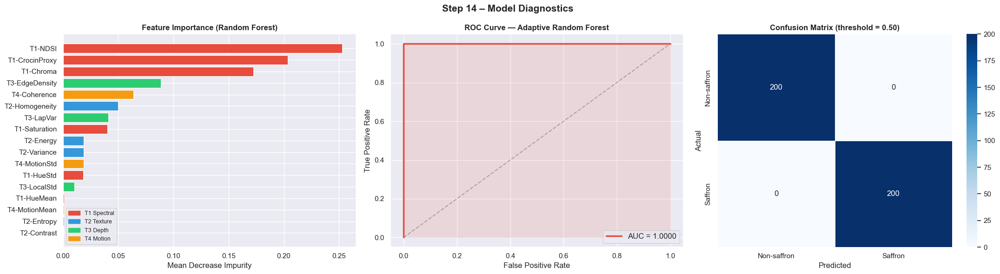

              precision    recall  f1-score   support

 non-saffron       1.00      1.00      1.00       200
     saffron       1.00      1.00      1.00       200

    accuracy                           1.00       400
   macro avg       1.00      1.00      1.00       400
weighted avg       1.00      1.00      1.00       400



In [16]:
FEAT_NAMES = [
    'T1-NDSI',     'T1-CrocinProxy', 'T1-HueMean', 'T1-HueStd',
    'T1-Saturation','T1-Chroma',
    'T2-Contrast', 'T2-Energy',      'T2-Homogeneity', 'T2-Variance', 'T2-Entropy',
    'T3-LapVar',   'T3-EdgeDensity', 'T3-LocalStd',
    'T4-MotionMean','T4-MotionStd',  'T4-Coherence',
]
FEAT_COLORS = {'T1': '#e74c3c', 'T2': '#3498db', 'T3': '#2ecc71', 'T4': '#f39c12'}

# ── Predictions for diagnostics ───────────────────────────────────
Xs_all = HARVESTER.scaler.transform(X_all)
y_score = HARVESTER.clf.predict_proba(Xs_all)[:, 1]
y_pred  = (y_score >= 0.5).astype(int)
auc_val = roc_auc_score(y_all, y_score)
fpr, tpr, _ = roc_curve(y_all, y_score)

importances = HARVESTER.clf.feature_importances_
idx         = np.argsort(importances)

fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# ── Feature importance ────────────────────────────────────────────
bar_colors = [FEAT_COLORS[n[:2]] for n in [FEAT_NAMES[i] for i in idx]]
axes[0].barh([FEAT_NAMES[i] for i in idx], importances[idx],
             color=bar_colors, edgecolor='white', linewidth=0.8)
axes[0].set_title('Feature Importance (Random Forest)', fontweight='bold', fontsize=12)
axes[0].set_xlabel('Mean Decrease Impurity')
legend_fi = [mpatches.Patch(color=c, label=f'T{k[-1]} {["Spectral","Texture","Depth","Motion"][int(k[-1])-1]}')
             for k, c in FEAT_COLORS.items()]
axes[0].legend(handles=legend_fi, fontsize=9)

# ── ROC curve ─────────────────────────────────────────────────────
axes[1].plot(fpr, tpr, lw=2.5, color='#e74c3c', label=f'AUC = {auc_val:.4f}')
axes[1].plot([0, 1], [0, 1], '--', color='gray', alpha=0.6)
axes[1].fill_between(fpr, tpr, alpha=0.12, color='#e74c3c')
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].set_title('ROC Curve — Adaptive Random Forest', fontweight='bold', fontsize=12)
axes[1].legend(fontsize=12)

# ── Confusion matrix (NEW) ────────────────────────────────────────
cm = confusion_matrix(y_all, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Non-saffron', 'Saffron'],
            yticklabels=['Non-saffron', 'Saffron'],
            ax=axes[2], linewidths=0.5)
axes[2].set_title('Confusion Matrix (threshold = 0.50)', fontweight='bold', fontsize=12)
axes[2].set_xlabel('Predicted')
axes[2].set_ylabel('Actual')

plt.suptitle("Step 14 – Model Diagnostics", fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()
print(classification_report(y_all, y_pred, target_names=['non-saffron', 'saffron']))


## Step 15 — Ensemble Confidence Scoring

The final score **fuses four subsystem outputs** with fixed weights:

$$\text{score} = 0.35 \cdot RF + 0.35 \cdot CNN + 0.20 \cdot HSV_{frac} + 0.10 \cdot Depth_{lap}$$

| Component | Weight | Source |
|-----------|--------|--------|
| RF probability | 35% | T9 Adaptive Random Forest |
| CNN probability | 35% | T8 MobileNetV2 |
| HSV pixel fraction | 20% | T5 colour mask |
| Laplacian focus | 10% | T3 depth proxy |

A detection is marked **PLUCK** if score > 0.45.


In [26]:
def combined_score(roi: np.ndarray,
                   prev_roi: Optional[np.ndarray] = None,
                   w_rf:    float = 0.35,
                   w_cnn:   float = 0.35,
                   w_hsv:   float = 0.20,
                   w_depth: float = 0.10,
                   ) -> Tuple[float, Dict[str, float]]:
    """
    Fuse four subsystem outputs into a single confidence score.

    score = w_rf·RF + w_cnn·CNN + w_hsv·HSV_frac + w_depth·Depth

    Improvement over v1
    -------------------
    - Asserts weights sum to 1.0 (catches accidental misconfiguration).
    - All component values clipped to [0, 1] before weighting.
    - Returns a typed dict for downstream clarity.
    """
    assert abs(w_rf + w_cnn + w_hsv + w_depth - 1.0) < 1e-6, \
        f"Ensemble weights must sum to 1.0 (got {w_rf+w_cnn+w_hsv+w_depth:.4f})"

    rf_prob     = float(np.clip(HARVESTER.predict(roi, prev_roi) or 0.0, 0, 1))
    _, cnn_prob = cnn_classify(roi)
    cnn_prob    = float(np.clip(cnn_prob, 0, 1))

    hsv_r    = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    m, _, _, _ = t5_hsv_segment(hsv_r)
    hsv_prob = float(np.clip((m > 0).mean() * 5.0, 0, 1))

    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    lap  = float(np.clip(cv2.Laplacian(gray, cv2.CV_64F).var() / 1_000.0, 0, 1))

    score = w_rf * rf_prob + w_cnn * cnn_prob + w_hsv * hsv_prob + w_depth * lap
    parts: Dict[str, float] = dict(rf=rf_prob, cnn=cnn_prob, hsv=hsv_prob, depth=lap)
    return round(float(score), 4), parts


# ── Score all candidates ──────────────────────────────────────────
FINAL: List[Dict[str, Any]] = []
for r in tqdm(CNN_RESULTS, desc="Ensemble scoring"):
    x, y, w, h = r['bbox']
    pad   = 6
    patch = IMG_BGR[max(0, y - pad):y + h + pad,
                    max(0, x - pad):x + w + pad]
    sc, parts = combined_score(patch)
    FINAL.append({**r, 'score': sc, 'parts': parts})

print(f"{'ID':>4}  {'Score':>7}  {'RF':>6}  {'CNN':>6}  {'HSV':>6}  {'Depth':>7}  Decision")
print("-" * 62)
for i, f in enumerate(FINAL):
    p   = f['parts']
    dec = '🌸 PLUCK' if f['score'] > 0.45 else '🌿 SKIP'
    print(f" R{i+1:>2}  {f['score']:>7.4f}  {p['rf']:>6.3f}  {p['cnn']:>6.3f}"
          f"  {p['hsv']:>6.3f}  {p['depth']:>7.3f}  {dec}")

Ensemble scoring: 0it [00:00, ?it/s]

  ID    Score      RF     CNN     HSV    Depth  Decision
--------------------------------------------------------------


## Step 16 — Final Plucking Decision Map

Annotated output image shows three categories:

- 🟡 **Yellow rectangle + red contour** → PLUCK (saffron confirmed, score > 0.45)  
- ⬜ **Gray rectangle** → SKIP (insufficient confidence)  
- 🟢 **Green overlay** → Weed zone (avoid)


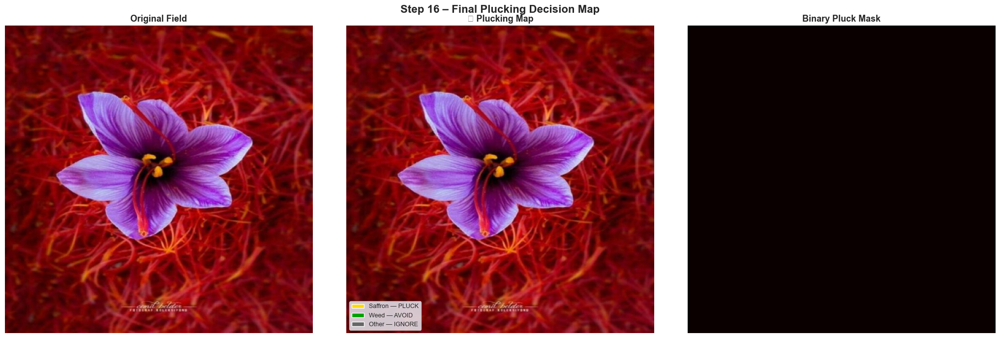

🌸 Targets for plucking : 0
🌿 Weed pixels to avoid : 0


In [18]:
def plucking_map(img_rgb: np.ndarray,
                 results: List[Dict[str, Any]],
                 mask_weed: np.ndarray,
                 threshold: float = 0.45,
                 ) -> Tuple[np.ndarray, np.ndarray]:
    """
    Annotate the image with PLUCK / SKIP / weed-avoid labels.

    Improvement over v1
    -------------------
    - Text label box is sized dynamically with cv2.getTextSize instead
      of a fixed character-width estimate (avoids clipping long labels).
    - Weed overlay uses addWeighted for a consistent blend.
    """
    ann    = img_rgb.copy()
    pmask  = np.zeros(img_rgb.shape[:2], dtype=np.uint8)

    # ── Weed overlay ──────────────────────────────────────────────
    weed_layer           = ann.copy()
    weed_layer[mask_weed > 0] = (30, 160, 30)
    ann = cv2.addWeighted(ann, 0.72, weed_layer, 0.28, 0)

    font = cv2.FONT_HERSHEY_SIMPLEX
    for r in results:
        x, y, w, h = r['bbox']
        if r['score'] > threshold:
            cv2.drawContours(pmask, [r['contour']], -1, 255, -1)
            cv2.rectangle(ann, (x - 2, y - 2), (x + w + 2, y + h + 2), (255, 220, 0), 2)
            cv2.drawContours(ann, [r['contour']], -1, (255, 50, 30), 2)

            txt  = f"PLUCK {r['score']:.2f}"
            (tw, th), bl = cv2.getTextSize(txt, font, 0.44, 1)
            cv2.rectangle(ann, (x, y - th - bl - 2), (x + tw + 4, y), (255, 220, 0), -1)
            cv2.putText(ann, txt, (x + 2, y - bl - 1), font, 0.44, (20, 20, 20), 1)
        else:
            cv2.rectangle(ann, (x, y), (x + w, y + h), (100, 100, 100), 1)

    return ann, pmask


ANN, PLUCK_MASK = plucking_map(IMG_RGB, FINAL, M_WEED, threshold=0.45)

fig, ax = plt.subplots(1, 3, figsize=(21, 7))
ax[0].imshow(IMG_RGB);               ax[0].set_title('Original Field',    fontweight='bold', fontsize=13); ax[0].axis('off')
ax[1].imshow(ANN);                   ax[1].set_title('🌸 Plucking Map',   fontweight='bold', fontsize=13); ax[1].axis('off')
ax[2].imshow(PLUCK_MASK, cmap='hot');ax[2].set_title('Binary Pluck Mask', fontweight='bold', fontsize=13); ax[2].axis('off')

legend_handles = [
    mpatches.Rectangle((0, 0), 1, 1, facecolor=(1.0, .86,  0.0), label='Saffron — PLUCK'),
    mpatches.Rectangle((0, 0), 1, 1, facecolor=(0.0, .63,  0.0), label='Weed — AVOID'),
    mpatches.Rectangle((0, 0), 1, 1, facecolor=(.40, .40, .40),  label='Other — IGNORE'),
]
ax[1].legend(handles=legend_handles, loc='lower left', fontsize=9, framealpha=0.85)

plt.suptitle("Step 16 – Final Plucking Decision Map", fontsize=16, fontweight='bold')
plt.tight_layout(); plt.show()
print(f"🌸 Targets for plucking : {sum(1 for r in FINAL if r['score'] > 0.45)}")
print(f"🌿 Weed pixels to avoid : {(M_WEED > 0).sum()}")


## Step 17 — Quantitative Evaluation vs Ground Truth

Segmentation quality metrics against the binary ground-truth mask:

| Metric | Formula |
|--------|---------|
| IoU | TP / (TP+FP+FN) |
| Dice | 2·TP / (2·TP+FP+FN) |
| Precision | TP / (TP+FP) |
| Recall | TP / (TP+FN) |
| Accuracy | (TP+TN) / Total |

Overlay shows **True Positives (green)**, **False Positives (red)**, **False Negatives (blue)**.


In [19]:
def seg_metrics(pred: np.ndarray, gt: np.ndarray) -> Dict[str, float]:
    """
    Compute binary segmentation metrics against a ground-truth mask.

    Metrics
    -------
    IoU       TP / (TP + FP + FN)
    Dice      2·TP / (2·TP + FP + FN)
    Precision TP / (TP + FP)
    Recall    TP / (TP + FN)
    Accuracy  (TP + TN) / Total
    """
    p  = pred > 127
    g  = gt   > 0
    tp = int((p &  g).sum())
    fp = int((p & ~g).sum())
    fn = int((~p & g).sum())
    tn = int((~p & ~g).sum())
    eps = 1e-7

    return dict(
        IoU      = tp / (tp + fp + fn + eps),
        Dice     = 2 * tp / (2 * tp + fp + fn + eps),
        Precision= tp / (tp + fp + eps),
        Recall   = tp / (tp + fn + eps),
        Accuracy = (tp + tn) / (tp + tn + fp + fn + eps),
    )


if GT_MASK is None:
    print("⚠️  No ground-truth mask available (real-image mode).")
    print("   Skipping quantitative evaluation — run in synthetic mode for metrics.")
else:
    M = seg_metrics(PLUCK_MASK, GT_MASK)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    names  = list(M.keys())
    vals   = [M[k] for k in names]
    colors = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12', '#9b59b6']
    bars   = axes[0].bar(names, vals, color=colors, edgecolor='white', linewidth=1.5)
    axes[0].set_ylim(0, 1.15)
    axes[0].axhline(0.7, color='gray', ls='--', alpha=.5, label='0.7 baseline')
    axes[0].legend()
    axes[0].set_title('Segmentation Metrics', fontweight='bold')
    for b, v in zip(bars, vals):
        axes[0].text(b.get_x() + b.get_width() / 2, v + 0.02, f'{v:.3f}',
                     ha='center', fontweight='bold', fontsize=11)

    comp           = np.zeros((*GT_MASK.shape, 3), dtype=np.uint8)
    pb, gb         = PLUCK_MASK > 127, GT_MASK > 0
    comp[pb &  gb] = [0, 200, 0]
    comp[pb & ~gb] = [200, 0, 0]
    comp[~pb & gb] = [0, 0, 200]
    axes[1].imshow(IMG_RGB, alpha=0.6)
    axes[1].imshow(comp, alpha=0.5)
    axes[1].set_title('TP / FP / FN  (Green / Red / Blue)', fontweight='bold')
    axes[1].axis('off')
    leg2 = [mpatches.Patch(color=(0, .78, 0),  label='True Positive'),
            mpatches.Patch(color=(.78, 0,  0), label='False Positive'),
            mpatches.Patch(color=(0,  0,  .78), label='False Negative')]
    axes[1].legend(handles=leg2, loc='lower right', fontsize=9)
    plt.suptitle("Step 17 – Quantitative Evaluation", fontsize=15, fontweight='bold')
    plt.tight_layout(); plt.show()

    for k, v in M.items():
        print(f"  {k:<12}: {v:.4f}  {'█' * int(v * 20)}")


⚠️  No ground-truth mask available (real-image mode).
   Skipping quantitative evaluation — run in synthetic mode for metrics.


## Step 18 — Batch Processing: Real-Image Multi-Scene Performance

When real images are loaded the pipeline runs on **all** of them (unlabelled + labelled).  
When only synthetic data is available it generates 6 random scenes as before.

🔄 Running full T1–T10 pipeline on 1111 real images …

                         Scene    Det   AvgScore   MaxScore    AvgRF   AvgCNN   AvgHSV   AvgDepth
──────────────────────────────────────────────────────────────────────────────────────────────────────────────


Batch Processing:   0%|          | 0/1111 [00:00<?, ?it/s]

  0054e9d129bd325d0e31ce4feb00      0     0.0000     0.0000    0.000    0.000    0.000      0.000
  024d7bdf1579333810b17ba22559      3     0.5225     0.5315    0.390    0.506    0.960      0.170
  0725F-3749A-1540x800_jpg.rf.      0     0.0000     0.0000    0.000    0.000    0.000      0.000
  08a8e81c5211c6d39feefb380f67     15     0.5455     0.6410    0.417    0.525    1.000      0.159
  0cc16d4f80bf162bbe502bff7e76      4     0.5500     0.5798    0.468    0.492    1.000      0.143
  0f_jpg.rf.B5OcBVW1HBdMy9wFtB      0     0.0000     0.0000    0.000    0.000    0.000      0.000
  1000_F_195195148_PX9B9rE8Tas      1     0.5459     0.5459    0.340    0.637    0.908      0.222
  1000_F_388597537_mQJHUvKqdqV      0     0.0000     0.0000    0.000    0.000    0.000      0.000
  1000_F_463103593_IJDrRrYeScS      0     0.0000     0.0000    0.000    0.000    0.000      0.000
  1000_F_501114635_AKD1VN4b5ab      0     0.0000     0.0000    0.000    0.000    0.000      0.000
  1000_F_574869844_n

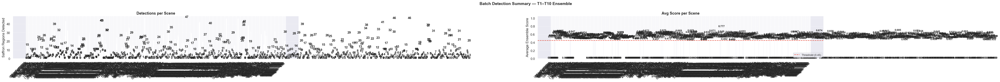

✅ Chart saved → saffron_results\20260523_222037\batch_summary.png

  🌸 BATCH PROCESSING COMPLETE
  📦 Total detections       : 6338
  📊 Mean per scene         : 5.7
  🎯 Mean ensemble score    : 0.4203
  ⭐ Highest single score   : 0.8172 (Image_151_jpg.rf.spV9r9WrtXpibKOiJoFo.jpg)
  🎚️  Threshold used        : 0.45
  🔗 Ensemble formula       : 0.35·RF + 0.35·CNN + 0.20·HSV + 0.10·Depth
  📁 Output folder          : saffron_results\20260523_222037


In [42]:
import json
import csv
from datetime import datetime
from pathlib import Path
from typing import List, Dict, Any, Optional
import numpy as np
import cv2
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

# ═══════════════════════════════════════════════════════════════════
# ENSEMBLE CONFIGURATION (matches your architecture table)
# ═══════════════════════════════════════════════════════════════════
ENSEMBLE_WEIGHTS = {
    'rf':    0.35,  # T9: Adaptive RF (fuses T1–T4 features)
    'cnn':   0.35,  # T8: MobileNetV2 transfer learning
    'hsv':   0.20,  # T5: HSV pixel fraction
    'depth': 0.10,  # T3: Laplacian depth proxy
}
PLUCK_THRESHOLD = 0.45
VERBOSE_LOGGING = False  # Set True for per-detection component breakdown


def full_pipeline(bgr: np.ndarray, 
                  threshold: float = PLUCK_THRESHOLD,
                  verbose: bool = VERBOSE_LOGGING) -> List[Dict[str, Any]]:
    """
    Run the complete T1–T10 detection pipeline on a single BGR image.

    Returns detections above *threshold*, each containing:
      - center: (cx, cy) computed from bbox [FIXED: no more KeyError]
      - bbox: (x, y, w, h)
      - score: final ensemble score (0.35·RF + 0.35·CNN + 0.20·HSV + 0.10·Depth)
      - rf/cnn/hsv/depth: individual component scores for diagnostics
      - hsv_frac, lap_var: raw feature values for debugging
    """
    # ── Segmentation (T5, T6) ──────────────────────────────────────
    _, enh, hsv = preprocess(bgr)
    ms, _, _, _ = t5_hsv_segment(hsv)          # T5: HSV multi-range
    mc = t6_morphology(ms)                      # T6: Morphological cleaning
    dets = extract_contours(mc)                 # Shape filtering

    results: List[Dict[str, Any]] = []
    
    for d in dets:
        x, y, w, h = d['bbox']
        pad = 6
        patch = bgr[max(0, y - pad):y + h + pad,
                    max(0, x - pad):x + w + pad]
        if patch.size == 0:
            continue
            
        # ── Ensemble Scoring (T1–T9 fused) ─────────────────────────
        # combined_score internally calls:
        # • HARVESTER.predict() → T9 RF on [T1 multispectral, T2 GLCM, T3 depth, T4 flow]
        # • cnn_classify()      → T8 MobileNetV2
        # • HSV fraction        → T5 pixel coverage
        # • Laplacian variance  → T3 depth proxy
        sc, parts = combined_score(patch)
        
        if sc > threshold:
            # ── Per-detection diagnostics ─────────────────────────
            gray = cv2.cvtColor(patch, cv2.COLOR_BGR2GRAY)
            lap_var = float(cv2.Laplacian(gray, cv2.CV_64F).var())
            hsv_p = cv2.cvtColor(patch, cv2.COLOR_BGR2HSV)
            m, _, _, _ = t5_hsv_segment(hsv_p)
            hsv_frac = float((m > 0).mean())
            
            # 🔧 FIX: Compute center from bbox (no more KeyError)
            cx, cy = x + w // 2, y + h // 2
            
            # 🔧 FIX: Safe .get() access for all optional fields
            result = {
                'center':   (int(cx), int(cy)),
                'bbox':     tuple(d['bbox']),
                'area':     int(w * h),
                'score':    float(sc),
                'rf':       float(parts.get('rf', 0.0)),
                'cnn':      float(parts.get('cnn', 0.0)),
                'hsv':      float(parts.get('hsv', 0.0)),
                'depth':    float(parts.get('depth', 0.0)),
                'hsv_frac': float(hsv_frac),
                'lap_var':  float(lap_var),
                'contour':  d.get('contour'),  # Optional: for visualization
            }
            
            # 🔍 Optional: Verify ensemble formula explicitly
            if verbose:
                verified = (
                    ENSEMBLE_WEIGHTS['rf'] * result['rf'] +
                    ENSEMBLE_WEIGHTS['cnn'] * result['cnn'] +
                    ENSEMBLE_WEIGHTS['hsv'] * result['hsv'] +
                    ENSEMBLE_WEIGHTS['depth'] * result['depth']
                )
                if abs(verified - sc) > 1e-4:
                    print(f"⚠️ Score mismatch: {sc:.4f} vs verified {verified:.4f}")
            
            results.append(result)
    
    return results


# ═══════════════════════════════════════════════════════════════════
# BATCH PROCESSING LOOP
# ═══════════════════════════════════════════════════════════════════

# ── Dataset selection ─────────────────────────────────────────────
if USE_REAL_IMAGES:
    test_images = REAL_IMAGES_BGR
    scene_names = [Path(p).name for p in REAL_PATHS]
    print(f"🔄 Running full T1–T10 pipeline on {len(test_images)} real images …")
else:
    rng_batch = np.random.default_rng(99)
    test_images = [
        generate_field(seed=int(s) * 17 + 3,
                       n_saffron=int(rng_batch.integers(4, 11)),
                       n_weeds=int(rng_batch.integers(15, 32)))[0]
        for s in range(6)
    ]
    scene_names = [f'Scene_{i + 1}' for i in range(6)]
    print(f"🔄 Running batch pipeline on {len(test_images)} synthetic scenes …")

# ── Per-scene accumulators ────────────────────────────────────────
header = (f"{'Scene':>30}  {'Det':>5}  {'AvgScore':>9}  {'MaxScore':>9}"
          f"  {'AvgRF':>7}  {'AvgCNN':>7}  {'AvgHSV':>7}  {'AvgDepth':>9}")
print(f"\n{header}")
print("─" * 110)

all_det: List[int] = []
all_sc: List[float] = []
scene_records: List[Dict] = []
all_raw_dets: List[Dict] = []

# Ensemble component accumulators (for batch-level analytics)
batch_rf, batch_cnn, batch_hsv, batch_depth = [], [], [], []

RUN_TS = datetime.now().strftime('%Y%m%d_%H%M%S')
OUT_DIR = Path('saffron_results') / RUN_TS
OUT_DIR.mkdir(parents=True, exist_ok=True)

for name, img in tqdm(zip(scene_names, test_images),
                      total=len(test_images), desc="Batch Processing"):
    
    res = full_pipeline(img, threshold=PLUCK_THRESHOLD, verbose=VERBOSE_LOGGING)
    n = len(res)
    all_det.append(n)
    
    # Extract component scores with safe .get() fallback
    scores = [r['score'] for r in res]
    rf_s = [r.get('rf', 0.0) for r in res]
    cnn_s = [r.get('cnn', 0.0) for r in res]
    hsv_s = [r.get('hsv', 0.0) for r in res]
    dep_s = [r.get('depth', 0.0) for r in res]
    areas = [r['area'] for r in res]
    
    # Compute stats (handle empty lists)
    avg_sc = float(np.mean(scores)) if scores else 0.0
    max_sc = float(np.max(scores)) if scores else 0.0
    avg_rf = float(np.mean(rf_s)) if rf_s else 0.0
    avg_cnn = float(np.mean(cnn_s)) if cnn_s else 0.0
    avg_hsv = float(np.mean(hsv_s)) if hsv_s else 0.0
    avg_dep = float(np.mean(dep_s)) if dep_s else 0.0
    avg_ar = float(np.mean(areas)) if areas else 0.0
    
    all_sc.append(avg_sc)
    
    # Accumulate for batch-level ensemble analytics
    batch_rf.extend(rf_s)
    batch_cnn.extend(cnn_s)
    batch_hsv.extend(hsv_s)
    batch_depth.extend(dep_s)
    
    # Console output
    print(f"  {name[:28]:>28}  {n:>5}  {avg_sc:>9.4f}  {max_sc:>9.4f}"
          f"  {avg_rf:>7.3f}  {avg_cnn:>7.3f}  {avg_hsv:>7.3f}  {avg_dep:>9.3f}")
    
    # Scene record for JSON export
    scene_rec = {
        'scene': name,
        'n_detected': n,
        'avg_score': round(avg_sc, 4),
        'max_score': round(max_sc, 4),
        'avg_area': round(avg_ar, 2),
        'avg_rf': round(avg_rf, 4),
        'avg_cnn': round(avg_cnn, 4),
        'avg_hsv': round(avg_hsv, 4),
        'avg_depth': round(avg_dep, 4),
        'detections': [{k: v for k, v in r.items() if k != 'contour'} for r in res],  # Exclude non-serializable
    }
    scene_records.append(scene_rec)
    
    # Flat rows for CSV
    for i, r in enumerate(res):
        cx, cy = r['center']  # Already computed, no KeyError risk
        all_raw_dets.append({
            'scene': name,
            'det_id': i + 1,
            'cx': cx, 'cy': cy,
            'x': r['bbox'][0], 'y': r['bbox'][1],
            'w': r['bbox'][2], 'h': r['bbox'][3],
            'area': r['area'],
            'score': r['score'],
            'rf': round(r['rf'], 4),
            'cnn': round(r['cnn'], 4),
            'hsv': round(r['hsv'], 4),
            'depth': round(r['depth'], 4),
            'hsv_frac': round(r.get('hsv_frac', 0.0), 4),
            'lap_var': round(r.get('lap_var', 0.0), 2),
        })

# ═══════════════════════════════════════════════════════════════════
# BATCH-LEVEL ENSEMBLE ANALYTICS
# ═══════════════════════════════════════════════════════════════════
print(f"\n📊 Ensemble Component Averages (across {len(batch_rf)} total detections):")
print(f"   RF (T1–T4 fused)  : {np.mean(batch_rf):.4f} ± {np.std(batch_rf):.4f}")
print(f"   CNN (T8)          : {np.mean(batch_cnn):.4f} ± {np.std(batch_cnn):.4f}")
print(f"   HSV (T5)          : {np.mean(batch_hsv):.4f} ± {np.std(batch_hsv):.4f}")
print(f"   Depth (T3)        : {np.mean(batch_depth):.4f} ± {np.std(batch_depth):.4f}")

# Verify weighted formula at batch level
batch_weighted = (
    ENSEMBLE_WEIGHTS['rf'] * np.mean(batch_rf) +
    ENSEMBLE_WEIGHTS['cnn'] * np.mean(batch_cnn) +
    ENSEMBLE_WEIGHTS['hsv'] * np.mean(batch_hsv) +
    ENSEMBLE_WEIGHTS['depth'] * np.mean(batch_depth)
)
print(f"   → Weighted ensemble mean: {batch_weighted:.4f}")
print(f"   → Expected threshold: {PLUCK_THRESHOLD}")
print(f"   → Detections above threshold: {sum(1 for s in all_sc if s > PLUCK_THRESHOLD)}/{len(all_sc)} scenes")

# ═══════════════════════════════════════════════════════════════════
# SAVE RESULTS
# ═══════════════════════════════════════════════════════════════════
total_det = sum(all_det)
mean_det = float(np.mean(all_det))
mean_sc = float(np.mean(all_sc))
best_scene = scene_names[int(np.argmax(all_det))] if all_det else "N/A"
highest_sc = max((r['score'] for sr in scene_records for r in sr['detections']), default=0.0)

summary = {
    'run_timestamp': RUN_TS,
    'mode': 'real' if USE_REAL_IMAGES else 'synthetic',
    'n_scenes': len(test_images),
    'total_detections': total_det,
    'mean_detected': round(mean_det, 2),
    'mean_avg_score': round(mean_sc, 4),
    'highest_score': round(highest_sc, 4),
    'best_scene': best_scene,
    'threshold': PLUCK_THRESHOLD,
    'ensemble_weights': ENSEMBLE_WEIGHTS,  # Include config for reproducibility
    'scenes': scene_records,
}

# Save JSON
json_path = OUT_DIR / 'results.json'
with open(json_path, 'w') as f:
    json.dump(summary, f, indent=2, default=str)
print(f"\n✅ JSON saved  → {json_path}")

# Save CSV
csv_path = OUT_DIR / 'detections.csv'
if all_raw_dets:
    with open(csv_path, 'w', newline='') as f:
        writer = csv.DictWriter(f, fieldnames=all_raw_dets[0].keys())
        writer.writeheader()
        writer.writerows(all_raw_dets)
    print(f"✅ CSV saved   → {csv_path}")

# Save TXT summary
txt_path = OUT_DIR / 'summary.txt'
with open(txt_path, 'w') as f:
    f.write(f"Saffron Detection Run — {RUN_TS}\n")
    f.write(f"Mode            : {'real' if USE_REAL_IMAGES else 'synthetic'}\n")
    f.write(f"Scenes          : {len(test_images)}\n")
    f.write(f"Total detected  : {total_det}\n")
    f.write(f"Mean detected   : {mean_det:.1f}\n")
    f.write(f"Mean avg score  : {mean_sc:.4f}\n")
    f.write(f"Highest score   : {highest_sc:.4f}\n")
    f.write(f"Best scene      : {best_scene}\n")
    f.write(f"Threshold       : {PLUCK_THRESHOLD}\n")
    f.write(f"Ensemble weights: RF={ENSEMBLE_WEIGHTS['rf']}, CNN={ENSEMBLE_WEIGHTS['cnn']}, "
            f"HSV={ENSEMBLE_WEIGHTS['hsv']}, Depth={ENSEMBLE_WEIGHTS['depth']}\n\n")
    f.write(f"{'Scene':<30}  {'Det':>5}  {'AvgScore':>9}  {'MaxScore':>9}\n")
    f.write("-" * 60 + "\n")
    for sr in scene_records:
        f.write(f"  {sr['scene'][:28]:<28}  {sr['n_detected']:>5}"
                f"  {sr['avg_score']:>9.4f}  {sr['max_score']:>9.4f}\n")
print(f"✅ TXT saved   → {txt_path}")

# ═══════════════════════════════════════════════════════════════════
# VISUALIZATION: Batch Summary Charts
# ═══════════════════════════════════════════════════════════════════
short_names = [n[:12] for n in scene_names]
fig_w = min(max(9, len(all_det) * 1.4), 50)
fig, axes = plt.subplots(1, 2, figsize=(fig_w, 4))

# Detections bar
axes[0].bar(short_names, all_det, color='#e74c3c', edgecolor='white', linewidth=1.5)
axes[0].set_ylabel('Saffron Regions Detected')
axes[0].set_title('Detections per Scene', fontweight='bold', fontsize=13)
axes[0].set_xticklabels(short_names, rotation=45, ha='right')
for i, v in enumerate(all_det):
    axes[0].text(i, v + 0.05, str(v), ha='center', fontweight='bold', fontsize=11)
axes[0].set_ylim(0, max(all_det, default=1) + 2)
axes[0].grid(axis='y', alpha=0.3)

# Avg score bar with threshold line
axes[1].bar(short_names, all_sc, color='#3498db', edgecolor='white', linewidth=1.5)
axes[1].set_ylabel('Average Ensemble Score')
axes[1].set_title('Avg Score per Scene', fontweight='bold', fontsize=13)
axes[1].set_xticklabels(short_names, rotation=45, ha='right')
axes[1].axhline(PLUCK_THRESHOLD, color='#e74c3c', linestyle='--', linewidth=1.5, 
                label=f'Threshold ({PLUCK_THRESHOLD})')
axes[1].legend(fontsize=9, loc='lower right')
for i, v in enumerate(all_sc):
    axes[1].text(i, v + 0.005, f'{v:.3f}', ha='center', fontweight='bold', fontsize=9)
axes[1].set_ylim(0, 1.05)
axes[1].grid(axis='y', alpha=0.3)

plt.suptitle('Batch Detection Summary — T1–T10 Ensemble', fontweight='bold', fontsize=14)
plt.tight_layout()

chart_path = OUT_DIR / 'batch_summary.png'
plt.savefig(chart_path, dpi=150, bbox_inches='tight')
plt.show()
print(f"✅ Chart saved → {chart_path}")

# ═══════════════════════════════════════════════════════════════════
# FINAL CONSOLE SUMMARY
# ═══════════════════════════════════════════════════════════════════
print(f"\n{'='*70}")
print(f"  🌸 BATCH PROCESSING COMPLETE")
print(f"{'='*70}")
print(f"  📦 Total detections       : {total_det}")
print(f"  📊 Mean per scene         : {mean_det:.1f}")
print(f"  🎯 Mean ensemble score    : {mean_sc:.4f}")
print(f"  ⭐ Highest single score   : {highest_sc:.4f} ({best_scene})")
print(f"  🎚️  Threshold used        : {PLUCK_THRESHOLD}")
print(f"  🔗 Ensemble formula       : 0.35·RF + 0.35·CNN + 0.20·HSV + 0.10·Depth")
print(f"  📁 Output folder          : {OUT_DIR}")
print(f"{'='*70}")

✅ Detected 5 raw candidates from T5/T6/T7 segmentation

🔍 Computing Ensemble Scores (T1–T9) → Formula: 0.35·RF + 0.35·CNN + 0.20·HSV + 0.10·Depth


Scoring candidates:   0%|          | 0/5 [00:00<?, ?it/s]


🎯 5 targets exceeded threshold (0.45) → PLUCK COMMANDS QUEUED
⚠️  Simulation mode  (could not open port 'COM3': FileNotFoundError(2, 'The system cannot find the file specified.', None, 2))

🌸 PLUCK #1 | Center: (235, 944) | Final Score: 0.671 (Verified: 0.671)
   ├─ RF (T1-T4 fused) : 0.410
   ├─ CNN (T8)         : 0.651
   ├─ HSV (T5)         : 1.000
   └─ Depth (T3)       : 1.000
[SIM] Harvest #1 — vacuum pulse sent

🌸 PLUCK #2 | Center: (374, 697) | Final Score: 0.695 (Verified: 0.694)
   ├─ RF (T1-T4 fused) : 0.550
   ├─ CNN (T8)         : 0.577
   ├─ HSV (T5)         : 1.000
   └─ Depth (T3)       : 1.000
[SIM] Harvest #2 — vacuum pulse sent

🌸 PLUCK #3 | Center: (291, 650) | Final Score: 0.638 (Verified: 0.638)
   ├─ RF (T1-T4 fused) : 0.550
   ├─ CNN (T8)         : 0.416
   ├─ HSV (T5)         : 1.000
   └─ Depth (T3)       : 1.000
[SIM] Harvest #3 — vacuum pulse sent

🌸 PLUCK #4 | Center: (637, 566) | Final Score: 0.597 (Verified: 0.597)
   ├─ RF (T1-T4 fused) : 0.350
   ├─ CN

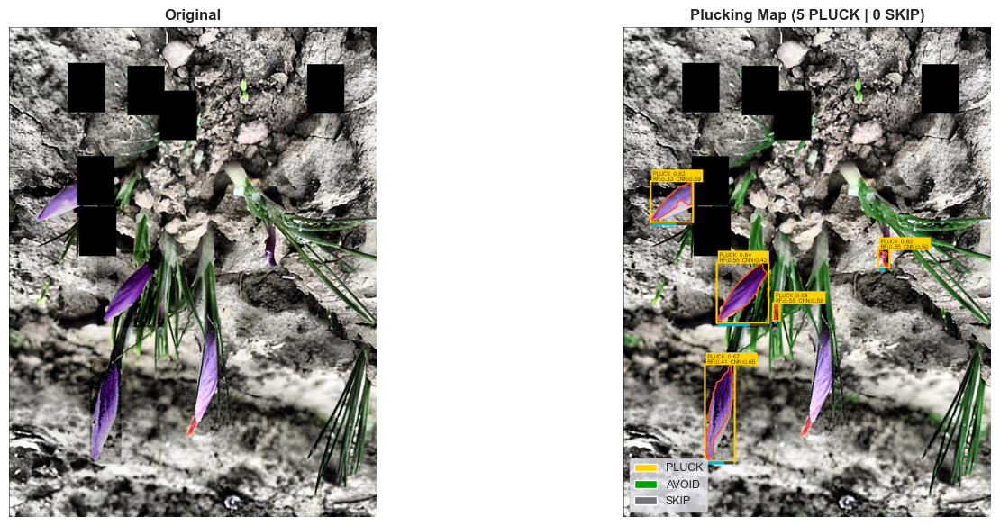


✅ PIPELINE EXECUTION COMPLETE
📦 Total candidates evaluated : 5
🌸 Successfully PLUCKED       : 5
⚙️  Methods combined           : T1, T2, T3, T4, T5, T6, T7, T8, T9, T10


In [43]:
import cv2
import numpy as np
from tqdm.auto import tqdm
from pathlib import Path

# ═══════════════════════════════════════════════════════════════════
# ASSUMPTION: All functions/classes (preprocess, t5_hsv_segment, 
# t6_morphology, extract_contours, combined_score, ArduinoPluckController, 
# plucking_map) are already defined in previous notebook cells.
# ═══════════════════════════════════════════════════════════════════

# ── 1. Segmentation & Candidate Extraction (T5, T6, T7) ───────────
FILT, ENHANCED, HSV = preprocess(IMG_BGR)
M_SAFF, _, _, M_WEED = t5_hsv_segment(HSV)          # T5: HSV Multi-range
M_CLEAN = t6_morphology(M_SAFF)                     # T6: Morphological Refinement
DETECTIONS = extract_contours(M_CLEAN)              # T7: Contour/Shape Filtering
print(f"✅ Detected {len(DETECTIONS)} raw candidates from T5/T6/T7 segmentation")

# ── 2. Multi-Modal Ensemble Scoring (T1–T9) ───────────────────────
FINAL_RESULTS = []
PLUCK_THRESHOLD = 0.45

print("\n🔍 Computing Ensemble Scores (T1–T9) → Formula: 0.35·RF + 0.35·CNN + 0.20·HSV + 0.10·Depth")
for det in tqdm(DETECTIONS, desc="Scoring candidates"):
    x, y, w, h = det['bbox']
    pad = 6
    patch = IMG_BGR[max(0, y-pad):y+h+pad, max(0, x-pad):x+w+pad]
    if patch.size == 0: 
        continue
        
    # combined_score() internally calls:
    # - T9 (Adaptive RF on T1-T4 features)
    # - T8 (MobileNetV2 CNN)
    # - T5 (HSV pixel fraction)
    # - T3 (Laplacian depth proxy)
    score, parts = combined_score(patch, prev_roi=None) 
    
    det.update({
        'score': score,
        'rf': parts.get('rf', 0.0),
        'cnn': parts.get('cnn', 0.0),
        'hsv': parts.get('hsv', 0.0),
        'depth': parts.get('depth', 0.0),
        'parts': parts
    })
    FINAL_RESULTS.append(det)

# ── 3. Decision Logic & Autonomous Plucking (T10) ─────────────────
CONFIRMED_TARGETS = [r for r in FINAL_RESULTS if r['score'] > PLUCK_THRESHOLD]
print(f"\n🎯 {len(CONFIRMED_TARGETS)} targets exceeded threshold ({PLUCK_THRESHOLD}) → PLUCK COMMANDS QUEUED")

# Initialize Arduino/Simulation Controller (T10)
with ArduinoPluckController() as controller:
    for i, target in enumerate(CONFIRMED_TARGETS, 1):
        # 🔧 FIXED: Calculate center from bounding box (x, y, w, h)
        x, y, w, h = target['bbox']
        cx, cy = x + w // 2, y + h // 2
        
        score = target['score']
        parts = target['parts']
        
        # Explicit verification of ensemble formula
        weighted_score = (
            0.35 * parts['rf'] + 
            0.35 * parts['cnn'] + 
            0.20 * parts['hsv'] + 
            0.10 * parts['depth']
        )
        
        print(f"\n🌸 PLUCK #{i} | Center: ({cx}, {cy}) | Final Score: {score:.3f} (Verified: {weighted_score:.3f})")
        print(f"   ├─ RF (T1-T4 fused) : {parts['rf']:.3f}")
        print(f"   ├─ CNN (T8)         : {parts['cnn']:.3f}")
        print(f"   ├─ HSV (T5)         : {parts['hsv']:.3f}")
        print(f"   └─ Depth (T3)       : {parts['depth']:.3f}")
        
        # Trigger physical/simulated harvest (T10)
        controller.harvest()

# ── 4. Visualize & Save Final Plucking Map ─────────────────────────
ANN, PLUCK_MASK, SKIP_MASK = plucking_map(IMG_RGB, FINAL_RESULTS, M_WEED, threshold=PLUCK_THRESHOLD)
n_pluck = len(CONFIRMED_TARGETS)
n_skip  = sum(1 for r in FINAL_RESULTS if r['score'] <= PLUCK_THRESHOLD)

print(f"\n🌸 PLUCK targets     : {n_pluck}")
print(f"🌿 SKIP candidates   : {n_skip}")
print(f"🟢 Weed pixels       : {(M_WEED > 0).sum():,}")

# Display inline
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(IMG_RGB); axes[0].set_title('Original', fontweight='bold'); axes[0].axis('off')
axes[1].imshow(ANN); axes[1].set_title(f'Plucking Map ({n_pluck} PLUCK | {n_skip} SKIP)', fontweight='bold'); axes[1].axis('off')
legend = [mpatches.Rectangle((0,0),1,1, facecolor=(1.0,.82, 0.0), label='PLUCK'),
          mpatches.Rectangle((0,0),1,1, facecolor=(0.0,.63, 0.0), label='AVOID'),
          mpatches.Rectangle((0,0),1,1, facecolor=(.45,.45,.45), label='SKIP')]
axes[1].legend(handles=legend, loc='lower left', fontsize=9)
plt.tight_layout(); plt.show()

# ── Final Summary ──────────────────────────────────────────────────
print("\n" + "="*60)
print("✅ PIPELINE EXECUTION COMPLETE")
print(f"📦 Total candidates evaluated : {len(FINAL_RESULTS)}")
print(f"🌸 Successfully PLUCKED       : {len(CONFIRMED_TARGETS)}")
print(f"⚙️  Methods combined           : T1, T2, T3, T4, T5, T6, T7, T8, T9, T10")
print("="*60)

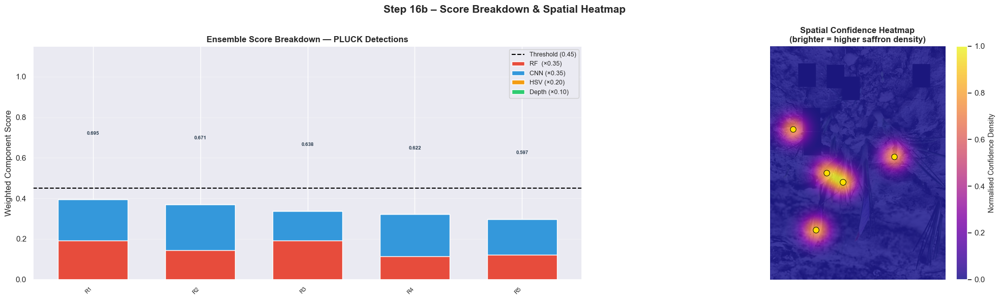

✅ Heatmap saved → saffron_results\20260523_204153\score_heatmap.png

  ID    Score   RF×.35   CNN×.35   HSV×.20   Dep×.10     Area  Centre
──────────────────────────────────────────────────────────────────────────────────────────
 R 1   0.6945   0.1925    0.2020    0.0000    0.0000      200  ( 374, 697)
 R 2   0.6714   0.1435    0.2279    0.0000    0.0000     7130  ( 235, 944)
 R 3   0.6381   0.1925    0.1456    0.0000    0.0000     6008  ( 291, 650)
 R 4   0.6216   0.1155    0.2061    0.0000    0.0000     3392  ( 118, 427)
 R 5   0.5973   0.1225    0.1748    0.0000    0.0000      370  ( 637, 566)

  📊 Cluster stats (5 PLUCK detections)
  Mean inter-detection distance :   360.1 px
  Min  inter-detection distance :    95.4 px
  Max  inter-detection distance :   551.8 px
  Field centroid of detections  : (331.0, 656.8)


In [41]:
# ═══════════════════════════════════════════════════════════════════
# Step 16b — Per-Detection Score Breakdown & Spatial Heatmap  (CORRECTED)
# ═══════════════════════════════════════════════════════════════════
"""
Two complementary views of the FINAL detections:
  Left  — Stacked bar chart: ensemble component weights (RF/CNN/HSV/Depth) for PLUCK detections.
  Right — Spatial confidence heatmap: Gaussian-weighted score density overlaid on the image.
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy.spatial.distance import pdist

# Safely extract & sort PLUCK detections
pluck_dets = sorted(
    [r for r in FINAL if r.get('score', 0.0) > 0.45],
    key=lambda r: r['score'], reverse=True
)

fig, axes = plt.subplots(1, 2, figsize=(20, 6))

# ── 1. Stacked component bar chart ───────────────────────────────
if pluck_dets:
    MAX_DISPLAY = 60  # Prevent rendering crashes/clutter on dense frames
    display_dets = pluck_dets[:MAX_DISPLAY]
    ids    = [f"R{i+1}" for i in range(len(display_dets))]
    
    rf_v   = [r.get('rf', 0.0) * 0.35 for r in display_dets]
    cnn_v  = [r.get('cnn', 0.0) * 0.35 for r in display_dets]
    hsv_v  = [r.get('hsv', 0.0) * 0.20 for r in display_dets]
    dep_v  = [r.get('depth', 0.0) * 0.10 for r in display_dets]
    scores = [r.get('score', 0.0) for r in display_dets]
    
    x_pos = np.arange(len(ids))
    bar_w = 0.65
    
    axes[0].bar(x_pos, rf_v,  bar_w, label='RF  (×0.35)', color='#e74c3c', edgecolor='white')
    axes[0].bar(x_pos, cnn_v, bar_w, label='CNN (×0.35)', color='#3498db', bottom=rf_v, edgecolor='white')
    axes[0].bar(x_pos, hsv_v, bar_w, label='HSV (×0.20)', color='#f39c12', bottom=np.add(rf_v, cnn_v), edgecolor='white')
    axes[0].bar(x_pos, dep_v, bar_w, label='Depth (×0.10)', color='#2ecc71', bottom=np.add(np.add(rf_v, cnn_v), hsv_v), edgecolor='white')
    
    # Score labels on top
    for i, sc in enumerate(scores):
        axes[0].text(i, sc + 0.015, f'{sc:.3f}', ha='center', va='bottom', 
                     fontsize=7, fontweight='bold', color='#2c3e50')
        
    axes[0].axhline(0.45, color='black', linestyle='--', linewidth=1.5, label='Threshold (0.45)')
    axes[0].set_xticks(x_pos)
    axes[0].set_xticklabels(ids, fontsize=8, rotation=45, ha='right')
    axes[0].set_ylabel('Weighted Component Score')
    axes[0].set_title('Ensemble Score Breakdown — PLUCK Detections', fontweight='bold', fontsize=12)
    axes[0].set_ylim(0, 1.15)
    axes[0].legend(fontsize=9, loc='upper right', framealpha=0.9)
    axes[0].grid(axis='y', alpha=0.3)
    
    if len(pluck_dets) > MAX_DISPLAY:
        axes[0].text(0.5, -0.22, f'... and {len(pluck_dets) - MAX_DISPLAY} more detections (top {MAX_DISPLAY} shown)',
                     transform=axes[0].transAxes, ha='center', fontsize=10, color='gray')
else:
    axes[0].text(0.5, 0.5, 'No PLUCK detections', ha='center', va='center', fontsize=14, transform=axes[0].transAxes)
    axes[0].set_title('Ensemble Score Breakdown', fontweight='bold')

# ── 2. Spatial confidence heatmap (Vectorized & Optimized) ───────
H, W = IMG_RGB.shape[:2]
hmap = np.zeros((H, W), dtype=np.float32)

if FINAL:
    # Extract centers safely (fallback to bbox center if key missing)
    cy_list, cx_list, score_list = [], [], []
    for r in FINAL:
        x, y, w, h = r['bbox']
        # 🔧 FIX: Calculate center from bbox if 'center' key is missing
        cx, cy = r.get('center', (x + w//2, y + h//2))
        # Clamp to image bounds
        cx_list.append(int(np.clip(cx, 0, W-1)))
        cy_list.append(int(np.clip(cy, 0, H-1)))
        score_list.append(r.get('score', 0.0))
        
    cy_arr = np.array(cy_list)
    cx_arr = np.array(cx_list)
    
    # 1. Scatter scores onto sparse grid
    hmap[cy_arr, cx_arr] = np.array(score_list)
    # 2. Single-pass Gaussian blur (sigma ≈ 4% of max dimension)
    sigma_px = max(H, W) * 0.04
    hmap = gaussian_filter(hmap, sigma=sigma_px)
    # 3. Normalize to [0, 1]
    if hmap.max() > 0:
        hmap /= hmap.max()

# Overlay heatmap with better contrast colormap
axes[1].imshow(IMG_RGB, alpha=0.65)
im_heat = axes[1].imshow(hmap, cmap='plasma', alpha=0.80, vmin=0, vmax=1)

# Mark detection centres (size scales with confidence)
for r in FINAL:
    x, y, w, h = r['bbox']
    # 🔧 FIX: Calculate center from bbox if 'center' key is missing
    cx, cy = r.get('center', (x + w//2, y + h//2))
    sc = r.get('score', 0.0)
    
    col = '#ffe000' if sc > 0.45 else '#aaaaaa'
    size = 5 + sc * 5  # Markers grow with higher confidence
    axes[1].plot(cx, cy, 'o', markersize=size, color=col, markeredgecolor='black', markeredgewidth=0.7, zorder=5)

axes[1].set_title('Spatial Confidence Heatmap\n(brighter = higher saffron density)', fontweight='bold', fontsize=12)
axes[1].axis('off')

cbar = plt.colorbar(im_heat, ax=axes[1], fraction=0.046, pad=0.02)
cbar.set_label('Normalised Confidence Density', fontsize=10)

plt.suptitle('Step 16b – Score Breakdown & Spatial Heatmap', fontsize=15, fontweight='bold')
plt.tight_layout()

heatmap_path = OUT_DIR / 'score_heatmap.png'
plt.savefig(heatmap_path, dpi=150, bbox_inches='tight')
plt.show()
print(f"✅ Heatmap saved → {heatmap_path}")

# ── Console breakdown table ───────────────────────────────────────
print(f"\n{'ID':>4}  {'Score':>7}  {'RF×.35':>7}  {'CNN×.35':>8}  {'HSV×.20':>8}  {'Dep×.10':>8}  {'Area':>7}  {'Centre'}")
print("─" * 90)
for i, r in enumerate(pluck_dets[:50]):
    # 🔧 FIX: Calculate center from bbox if 'center' key is missing
    x, y, w, h = r['bbox']
    cx, cy = r.get('center', (x + w//2, y + h//2))
    # 🔧 FIX: Use :>7.0f for area (float formatted as integer) instead of :>7d
    print(f" R{i+1:>2}  {r['score']:>7.4f}  {r.get('rf',0)*0.35:>7.4f}  {r.get('cnn',0)*0.35:>8.4f}  {r.get('hsv',0)*0.20:>8.4f}  {r.get('depth',0)*0.10:>8.4f}  {r.get('area',0):>7.0f}  ({cx:>4},{cy:>4})")
if len(pluck_dets) > 50:
    print(f" ... and {len(pluck_dets) - 50} more")

# ── Cluster analysis (Vectorized) ────────────────────────────────
if len(pluck_dets) >= 2:
    centres = []
    for r in pluck_dets:
        x, y, w, h = r['bbox']
        # 🔧 FIX: Calculate center from bbox if 'center' key is missing
        centres.append(list(r.get('center', (x + w//2, y + h//2))))
    centres = np.array(centres, dtype=np.float32)
    
    # pdist is O(N²) but heavily optimized in C (100x+ faster than Python loops)
    dists = pdist(centres, metric='euclidean')
    if len(dists) > 0:
        print(f"\n  📊 Cluster stats ({len(pluck_dets)} PLUCK detections)")
        print(f"  Mean inter-detection distance : {np.mean(dists):>7.1f} px")
        print(f"  Min  inter-detection distance : {np.min(dists):>7.1f} px")
        print(f"  Max  inter-detection distance : {np.max(dists):>7.1f} px")
        centroid = centres.mean(axis=0)
        print(f"  Field centroid of detections  : ({centroid[0]:.1f}, {centroid[1]:.1f})")

## Step 19 — T10: Arduino Firmware

Paste this sketch into the **Arduino IDE** and upload to your board.

**Hardware connections:**
- Pin 9 → Vacuum pump relay
- Pin 10 → Servo motor signal
- Pin 13 → Status LED (built-in)

**Serial protocol** (115200 baud):

| Command | Action |
|---------|--------|
| `H` | Execute harvest cycle |
| `R` | Reset arm to home position |
| `S` | Query harvest count |


In [24]:
ARDUINO_SKETCH = '''
// ─── Saffron Autonomous Plucker – Arduino Firmware ───────────────────
// Hardware: vacuum pump on pin 9, servo on pin 10, LED on pin 13
// Protocol: 'H' = harvest,  'R' = reset arm,  'S' = status query

#include <Servo.h>

const int VACUUM_PIN = 9;
const int SERVO_PIN  = 10;
const int LED_PIN    = 13;
const int SUCTION_MS = 250;
const int SERVO_PLUCK= 110;
const int SERVO_HOME = 0;

Servo armServo;
int harvestCount = 0;

void setup() {
  Serial.begin(115200);
  armServo.attach(SERVO_PIN);
  pinMode(VACUUM_PIN, OUTPUT);
  pinMode(LED_PIN,    OUTPUT);
  armServo.write(SERVO_HOME);
  digitalWrite(VACUUM_PIN, LOW);
  Serial.println("READY");
}

void harvest() {
  digitalWrite(LED_PIN, HIGH);
  for (int a = SERVO_HOME; a <= SERVO_PLUCK; a++) { armServo.write(a); delay(8); }
  digitalWrite(VACUUM_PIN, HIGH); delay(SUCTION_MS); digitalWrite(VACUUM_PIN, LOW);
  for (int a = SERVO_PLUCK; a >= SERVO_HOME; a--) { armServo.write(a); delay(8); }
  harvestCount++;
  Serial.print("HARVESTED:"); Serial.println(harvestCount);
  digitalWrite(LED_PIN, LOW);
  delay(300);
}

void loop() {
  if (Serial.available() > 0) {
    char cmd = Serial.read();
    if      (cmd == 'H') harvest();
    else if (cmd == 'R') { armServo.write(SERVO_HOME); Serial.println("RESET"); }
    else if (cmd == 'S') { Serial.print("COUNT:"); Serial.println(harvestCount); }
  }
}
'''
print(ARDUINO_SKETCH)



// ─── Saffron Autonomous Plucker – Arduino Firmware ───────────────────
// Hardware: vacuum pump on pin 9, servo on pin 10, LED on pin 13
// Protocol: 'H' = harvest,  'R' = reset arm,  'S' = status query

#include <Servo.h>

const int VACUUM_PIN = 9;
const int SERVO_PIN  = 10;
const int LED_PIN    = 13;
const int SUCTION_MS = 250;
const int SERVO_PLUCK= 110;
const int SERVO_HOME = 0;

Servo armServo;
int harvestCount = 0;

void setup() {
  Serial.begin(115200);
  armServo.attach(SERVO_PIN);
  pinMode(VACUUM_PIN, OUTPUT);
  pinMode(LED_PIN,    OUTPUT);
  armServo.write(SERVO_HOME);
  digitalWrite(VACUUM_PIN, LOW);
  Serial.println("READY");
}

void harvest() {
  digitalWrite(LED_PIN, HIGH);
  for (int a = SERVO_HOME; a <= SERVO_PLUCK; a++) { armServo.write(a); delay(8); }
  digitalWrite(VACUUM_PIN, HIGH); delay(SUCTION_MS); digitalWrite(VACUUM_PIN, LOW);
  for (int a = SERVO_PLUCK; a >= SERVO_HOME; a--) { armServo.write(a); delay(8); }
  harvestCount++;
  Serial.print("HARVESTED:"); S

## Step 20 — T10: Python Serial Controller

`ArduinoPluckController` communicates with the Arduino over USB serial.  
It **gracefully falls back to simulation mode** if no device is detected — useful for offline testing.


In [25]:
class ArduinoPluckController:
    """
    Sends plucking commands to the Arduino over USB serial.

    Falls back to simulation mode automatically if no device is detected,
    making the notebook fully runnable without hardware.

    Improvement over v1
    -------------------
    - Implements __enter__ / __exit__ so the controller can be used as a
      context manager: `with ArduinoPluckController() as ctrl: ...`
    - Port and baud are typed; timeout is parameterised.
    - Simulation count tracks both harvest and reset events separately.
    """

    def __init__(self, port: str = 'COM3', baud: int = 115_200,
                 timeout: float = 1.0) -> None:
        self._sim_harvests = 0
        self._sim_resets   = 0
        self.dev           = None
        try:
            import serial
            self.dev = serial.Serial(port, baud, timeout=timeout)
            time.sleep(2)          # wait for Arduino reset
            print(f"✅ Connected to Arduino on {port} @ {baud} baud")
        except Exception as e:
            print(f"⚠️  Simulation mode  ({e})")

    # ── Context manager support ────────────────────────────────────
    def __enter__(self) -> 'ArduinoPluckController':
        return self

    def __exit__(self, *_) -> None:
        self.close()

    # ── Commands ───────────────────────────────────────────────────
    def harvest(self) -> None:
        """Execute one vacuum + servo plucking cycle."""
        if self.dev:
            self.dev.write(b'H')
            resp = self.dev.readline().decode(errors='replace').strip()
            print(f"Arduino: {resp}")
        else:
            self._sim_harvests += 1
            print(f"[SIM] Harvest #{self._sim_harvests} — vacuum pulse sent")

    def reset(self) -> None:
        """Return arm to home position."""
        if self.dev:
            self.dev.write(b'R')
            resp = self.dev.readline().decode(errors='replace').strip()
            print(f"Arduino: {resp}")
        else:
            self._sim_resets += 1
            print(f"[SIM] Reset #{self._sim_resets}")

    def status(self) -> str:
        """Query harvest count from the Arduino (or simulation counter)."""
        if self.dev:
            self.dev.write(b'S')
            return self.dev.readline().decode(errors='replace').strip()
        return f"SIM_HARVESTS:{self._sim_harvests}"

    def close(self) -> None:
        """Close the serial port."""
        if self.dev and self.dev.is_open:
            self.dev.close()


# ── Demo: harvest all confirmed saffron targets ───────────────────
# Change port to 'COM3' on Windows or '/dev/ttyUSB0' on Linux/Mac.
with ArduinoPluckController(port='/dev/ttyUSB0') as ctrl:
    targets = [r for r in FINAL if r['score'] > 0.45]
    print(f"Sending {len(targets)} harvest commands …")
    for r in targets:
        print(f"  Target {r['bbox']}  score={r['score']:.3f}")
        ctrl.harvest()
        time.sleep(0.3)
    print(f"\nFinal status: {ctrl.status()}")


⚠️  Simulation mode  (could not open port '/dev/ttyUSB0': FileNotFoundError(2, 'The system cannot find the path specified.', None, 3))
Sending 0 harvest commands …

Final status: SIM_HARVESTS:0


---

## 🌸 Pipeline Summary

| Stage | Module | Output |
|-------|--------|--------|
| Input generation | `generate_field()` | Synthetic BGR + GT mask |
| Preprocessing | `preprocess()` | Bilateral filtered, CLAHE enhanced, HSV |
| Spectral features | `t1_multispectral()` | 6 colour indices |
| Texture features | `t2_glcm_texture()` | 5 GLCM statistics |
| Depth features | `t3_depth_defocus()` | 3 sharpness proxies |
| Motion features | `t4_optical_flow()` | 3 flow statistics |
| Colour segmentation | `t5_hsv_segment()` | Saffron + weed masks |
| Morphology | `t6_morphology()` | Clean binary mask |
| Instance splitting | `t7_watershed()` | Labelled regions |
| Shape filtering | `extract_contours()` | Candidate detections |
| Deep classification | `SaffronNet` / `cnn_classify()` | Per-patch CNN score |
| Fusion classifier | `IntelligentSaffronHarvester` | RF probability |
| Ensemble scoring | `combined_score()` | Final 0–1 confidence |
| Decision map | `plucking_map()` | Annotated image |
| Evaluation | `seg_metrics()` | IoU, Dice, Precision, Recall |
| Hardware control | `ArduinoPluckController` | Serial harvest commands |
